<a href="https://colab.research.google.com/github/EldarEyvazov/Machine-Learning-for-Human-data/blob/main/Eldar_Eyvazov_C4_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#importing
from google.colab import drive
import numpy as np
import matplotlib.pyplot as plt
import os
import tensorflow as tf
from tensorflow.keras import layers, Input
from tensorflow.keras.layers import Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, Dropout, Concatenate
from tensorflow.keras.models import Model, load_model
import time
import pickle
from sklearn.metrics import classification_report
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras import layers, models
import random
import warnings
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay




# Work plan of the project:


1.   We are aiming to use all three versions of dataset
2.   Starting with shallow CNN models, 2 layers to 5 or 6 depending on performance
3.  Implementing ResNet
4. Residual Attention Networks





In [ ]:
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Load the dataset
data = np.load('/content/drive/MyDrive/Mnist/bloodmnist_128.npz')

# Print the keys in the dataset
print("Keys in dataset:", data.keys())

# Inspect the shape and type of each key
for key in data.keys():
    print(f"{key} - Shape: {data[key].shape}, Type: {data[key].dtype}")




Keys in dataset: KeysView(NpzFile '/content/drive/MyDrive/Mnist/bloodmnist_128.npz' with keys: train_images, train_labels, val_images, val_labels, test_images...)
train_images - Shape: (11959, 128, 128, 3), Type: uint8
train_labels - Shape: (11959, 1), Type: uint8
val_images - Shape: (1712, 128, 128, 3), Type: uint8
val_labels - Shape: (1712, 1), Type: uint8
test_images - Shape: (3421, 128, 128, 3), Type: uint8
test_labels - Shape: (3421, 1), Type: uint8


In [ ]:
# Load the dataset
data_224 = np.load('/content/drive/MyDrive/Mnist/bloodmnist_224.npz')

# Print the keys in the dataset
print("Keys in dataset:", data_224.keys())

# Inspect the shape and type of each key
for key in data_224.keys():
    print(f"{key} - Shape: {data_224[key].shape}, Type: {data_224[key].dtype}")

Keys in dataset: KeysView(NpzFile '/content/drive/MyDrive/Mnist/bloodmnist_224.npz' with keys: train_images, train_labels, val_images, val_labels, test_images...)
train_images - Shape: (11959, 224, 224, 3), Type: uint8
train_labels - Shape: (11959, 1), Type: uint8
val_images - Shape: (1712, 224, 224, 3), Type: uint8
val_labels - Shape: (1712, 1), Type: uint8
test_images - Shape: (3421, 224, 224, 3), Type: uint8
test_labels - Shape: (3421, 1), Type: uint8


In [ ]:
# Load the dataset
data_64 = np.load('/content/drive/MyDrive/Mnist/bloodmnist_64.npz')

# Print the keys in the dataset
print("Keys in dataset:", data_64.keys())

# Inspect the shape and type of each key
for key in data_64.keys():
    print(f"{key} - Shape: {data_64[key].shape}, Type: {data_64[key].dtype}")




Keys in dataset: KeysView(NpzFile '/content/drive/MyDrive/Mnist/bloodmnist_64.npz' with keys: train_images, train_labels, val_images, val_labels, test_images...)
train_images - Shape: (11959, 64, 64, 3), Type: uint8
train_labels - Shape: (11959, 1), Type: uint8
val_images - Shape: (1712, 64, 64, 3), Type: uint8
val_labels - Shape: (1712, 1), Type: uint8
test_images - Shape: (3421, 64, 64, 3), Type: uint8
test_labels - Shape: (3421, 1), Type: uint8


There are 3 versions of blood mnist dataset, 64x64x3, 128x128x3, 224x224x3

In [ ]:
#128x128x3 dataset
X_train = data['train_images'].astype(np.float32)
X_val = data['val_images'].astype(np.float32)
X_test = data['test_images'].astype(np.float32)
y_train = data['train_labels']
y_val = data['val_labels']
y_test = data['test_labels']



print(f"y_train shape:",y_train[1].shape)
print(f"y_val shape:", y_val.shape)
print(f"y_test shape:",y_test.shape)

y_train shape: (1,)
y_val shape: (1712, 1)
y_test shape: (3421, 1)


In [ ]:
#224x224x3 dataset
X_train_224 = data_224['train_images'].astype(np.float32)
X_val_224 = data_224['val_images'].astype(np.float32)
X_test_224 = data_224['test_images'].astype(np.float32)
y_train_224 = data_224['train_labels']
y_val_224 = data_224['val_labels']
y_test_224 = data_224['test_labels']



print(f"y_train shape:",y_train_224[1].shape)
print(f"y_val shape:", y_val_224.shape)
print(f"y_test shape:",y_test_224.shape)

y_train shape: (1,)
y_val shape: (1712, 1)
y_test shape: (3421, 1)


In [ ]:
# 64x64x3 dataset

X_train_64 = data_64['train_images'].astype(np.float32)
X_val_64 = data_64['val_images'].astype(np.float32)
X_test_64 = data_64['test_images'].astype(np.float32)
y_train_64 = data_64['train_labels']
y_val_64 = data_64['val_labels']
y_test_64 = data_64['test_labels']



print(f"y_train shape:",y_train_64[1].shape)
print(f"y_val shape:", y_val_64.shape)
print(f"y_test shape:",y_test_64.shape)

y_train shape: (1,)
y_val shape: (1712, 1)
y_test shape: (3421, 1)


In [ ]:
# Check unique labels in the training set
unique_train_labels = np.unique(y_train)
print(f"Unique labels in y_train: {unique_train_labels}")
print(f"Number of unique labels in y_train: {len(unique_train_labels)}")

# Check unique labels in the validation set
unique_val_labels = np.unique(y_val)
print(f"Unique labels in y_val: {unique_val_labels}")
print(f"Number of unique labels in y_val: {len(unique_val_labels)}")

# Check unique labels in the test set
unique_test_labels = np.unique(y_test)
print(f"Unique labels in y_test: {unique_test_labels}")
print(f"Number of unique labels in y_test: {len(unique_test_labels)}")


Unique labels in y_train: [0 1 2 3 4 5 6 7]
Number of unique labels in y_train: 8
Unique labels in y_val: [0 1 2 3 4 5 6 7]
Number of unique labels in y_val: 8
Unique labels in y_test: [0 1 2 3 4 5 6 7]
Number of unique labels in y_test: 8


In [ ]:
# Check unique labels in the training set
unique_train_labels_64 = np.unique(y_train_64)
print(f"Unique labels in y_train: {unique_train_labels_64}")
print(f"Number of unique labels in y_train: {len(unique_train_labels_64)}")

# Check unique labels in the validation set
unique_val_labels_64 = np.unique(y_val_64)
print(f"Unique labels in y_val: {unique_val_labels_64}")
print(f"Number of unique labels in y_val: {len(unique_val_labels_64)}")

# Check unique labels in the test set
unique_test_labels_64 = np.unique(y_test_64)
print(f"Unique labels in y_test: {unique_test_labels_64}")
print(f"Number of unique labels in y_test: {len(unique_test_labels_64)}")


Unique labels in y_train: [0 1 2 3 4 5 6 7]
Number of unique labels in y_train: 8
Unique labels in y_val: [0 1 2 3 4 5 6 7]
Number of unique labels in y_val: 8
Unique labels in y_test: [0 1 2 3 4 5 6 7]
Number of unique labels in y_test: 8


In [ ]:
#Labels for later use

labels_mapping = {
    0: "basophil",
    1: "eosinophil",
    2: "erythroblast",
    3: "immature granulocytes",
    4: "lymphocyte",
    5: "monocyte",
    6: "neutrophil",
    7: "platelet"
}

# New section

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def create_dataset(images, labels, image_shape, batch_size, shuffle=True, cache_file=None):
    # Create a Dataset object
    dataset = tf.data.Dataset.from_tensor_slices((images, labels))
    print("Created dataset from tensor slices")

    # Define the data augmentation pipeline
    data_augmentation = tf.keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical"),       # Random flipping
        layers.RandomRotation(0.2),                         # Random rotation
        layers.RandomZoom(0.1),                             # Random zoom
        layers.RandomTranslation(0.1, 0.1),                 # Random translation
        layers.RandomContrast(0.2),                         # Random contrast adjustment
    ])
    print("Initialized data augmentation pipeline")

    # Normalize images (scale to [0, 1]) and apply augmentations
    def preprocess_img(image, label):
        image = tf.cast(image, tf.float32) / 255.0  # Normalize image to [0, 1]
        image = data_augmentation(image)  # Apply augmentations
        image = tf.clip_by_value(image, 0.0, 1.0)  # Clip to ensure values stay in [0, 1]
        return image, label

    dataset = dataset.map(preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
    print("Normalized, augmented, and clipped images")

    # Cache dataset
    if cache_file:
        dataset = dataset.cache(cache_file)
        print("Cached dataset")

    # Shuffle dataset
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(images))
        print("Shuffled dataset")

    # Batch dataset
    dataset = dataset.batch(batch_size=batch_size)
    print("Batched dataset")

    # Prefetch dataset
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    print("Prefetched dataset")

    return dataset




*   Creating dataset for each 3 sizes




In [ ]:
image_shape = (224, 224, 3)
batch_size = 64

train_dataset_224 = create_dataset(X_train_224, y_train_224, image_shape, batch_size, shuffle=True)
val_dataset_224 = create_dataset(X_val_224, y_val_224, image_shape, batch_size, shuffle=False)
test_dataset_224 = create_dataset(X_test_224, y_test_224, image_shape, batch_size, shuffle=False)

Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Shuffled dataset
Batched dataset
Prefetched dataset
Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Batched dataset
Prefetched dataset
Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Batched dataset
Prefetched dataset


In [ ]:
image_shape = (128, 128, 3)
batch_size = 64

train_dataset = create_dataset(X_train, y_train, image_shape, batch_size, shuffle=True)
val_dataset = create_dataset(X_val, y_val, image_shape, batch_size, shuffle=False)
test_dataset = create_dataset(X_test, y_test, image_shape, batch_size, shuffle=False)

Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Shuffled dataset
Batched dataset
Prefetched dataset
Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Batched dataset
Prefetched dataset
Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Batched dataset
Prefetched dataset


In [ ]:
#64x64x3 dataset
image_shape = (64, 64, 3)
batch_size = 64

train_dataset_64 = create_dataset(X_train_64, y_train_64, image_shape, batch_size, shuffle=True)
val_dataset_64 = create_dataset(X_val_64, y_val_64, image_shape, batch_size, shuffle=False)
test_dataset_64 = create_dataset(X_test_64, y_test_64, image_shape, batch_size, shuffle=False)

Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Shuffled dataset
Batched dataset
Prefetched dataset
Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Batched dataset
Prefetched dataset
Created dataset from tensor slices
Initialized data augmentation pipeline
Normalized, augmented, and clipped images
Batched dataset
Prefetched dataset


In [ ]:
import tensorflow as tf

@tf.keras.utils.register_keras_serializable()
class MetricsWrapper(tf.keras.metrics.Metric):
    def __init__(self, metric, num_classes, average_type=None, name=None, **kwargs):
        super().__init__(name=name or metric.name, **kwargs)
        self.metric = metric
        self.num_classes = num_classes
        self.average_type = average_type

        # Create a list of AUC objects, one per class
        self.auc_per_class = [tf.keras.metrics.AUC() for _ in range(self.num_classes)]

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.squeeze(y_true, axis=-1)  # Remove the extra dimension if it exists
        y_true_onehot = tf.one_hot(tf.cast(y_true, tf.int32), depth=self.num_classes)

        if self.average_type == "macro":
            aucs = []
            for i in range(self.num_classes):
                y_true_class = y_true_onehot[:, i]
                y_pred_class = y_pred[:, i]
                self.auc_per_class[i].update_state(y_true_class, y_pred_class, sample_weight)
                aucs.append(self.auc_per_class[i].result())
            return tf.reduce_mean(aucs)
        elif self.average_type == "weighted":
            class_weights = tf.reduce_sum(y_true_onehot, axis=0)
            class_weights = tf.math.divide_no_nan(1.0, class_weights)
            sample_weights = tf.gather(class_weights, tf.argmax(y_true_onehot, axis=-1))
            self.metric.update_state(y_true_onehot, y_pred, sample_weights)
        else:
            self.metric.update_state(y_true_onehot, y_pred, sample_weight)

    def result(self):
        return self.metric.result()

    def reset_states(self):
        for auc in self.auc_per_class:
            auc.reset_states()

    def get_config(self):
        # Add custom arguments for serialization
        config = super().get_config()
        config.update({
            "metric": tf.keras.metrics.serialize(self.metric),
            "num_classes": self.num_classes,
            "average_type": self.average_type
        })
        return config

    @classmethod
    def from_config(cls, config):
        # Deserialize custom arguments
        metric = tf.keras.metrics.deserialize(config.pop("metric"))
        return cls(metric=metric, **config)


# Functions for later usage

In [ ]:
import tensorflow as tf
import csv
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import backend as K

# Custom callback to save metrics to CSV
class CSVLogger(Callback):
    def __init__(self, filename, separator=',', append=False):
        super(CSVLogger, self).__init__()
        self.sep = separator
        self.filename = filename
        self.append = append
        self.csv_file = None
        self.writer = None
        self.keys = None
        self.append_header = True

    def on_train_begin(self, logs=None):
        if self.append:
            if tf.io.gfile.exists(self.filename):
                with open(self.filename, 'r') as f:
                    self.append_header = not bool(len(f.readline()))
            mode = 'a'
        else:
            mode = 'w'

        self.csv_file = open(self.filename, mode, newline='')
        self.writer = csv.DictWriter(self.csv_file, fieldnames=None, delimiter=self.sep)
        self.keys = None

    def on_epoch_end(self, epoch, logs=None):
        if not self.keys:
            self.keys = sorted(logs.keys())
            self.writer.fieldnames = ['epoch'] + self.keys
            if self.append_header:
                self.writer.writeheader()

        row_dict = {'epoch': epoch}
        row_dict.update((key, logs[key]) for key in self.keys)
        self.writer.writerow(row_dict)
        self.csv_file.flush()

    def on_train_end(self, logs=None):
        if self.csv_file:
            self.csv_file.close()
            self.csv_file = None
            self.writer = None
            self.keys = None


In [ ]:
def train_model(model, train_dataset, val_dataset, batch_size, epochs, save_path, csv_log_path, learning_rate=None, num_classes=8, average_type=None):
    import json  # For saving/loading training metadata

    # Initialize lists to store the metrics
    history_dict = {
        'loss': [],
        'accuracy': [],
        'auc': [],
        'precision': [],
        'recall': [],
        'val_loss': [],
        'val_accuracy': [],
        'val_auc': [],
        'val_precision': [],
        'val_recall': []
    }

    metadata_path = save_path + "_metadata.json"  # To save training metadata (e.g., training time)

    # Check if the model already exists
    if os.path.exists(save_path + ".keras"):
        print("Model already exists. Loading the saved model.")

        # Use custom_objects to ensure MetricsWrapper is recognized
        model = load_model(save_path + ".keras", custom_objects={"MetricsWrapper": MetricsWrapper})

        # Load training metadata if it exists
        if os.path.exists(metadata_path):
            with open(metadata_path, 'r') as f:
                metadata = json.load(f)
            total_training_time = metadata.get("total_training_time", None)
            if total_training_time is not None:
                print(f"Total training time from saved model: {total_training_time:.2f} seconds")
            else:
                print("Training time metadata not found.")
        else:
            print("Metadata file not found. Cannot retrieve training time.")

    else:
        print("Model not found. Training a new model.")

        # Start measuring total training time
        start_time = time.time()

        # Compile the model
        auc = MetricsWrapper(tf.keras.metrics.AUC(name="auc"), num_classes=num_classes, average_type=average_type)
        precision = MetricsWrapper(tf.keras.metrics.Precision(name="precision"), num_classes=num_classes, average_type=average_type)
        recall = MetricsWrapper(tf.keras.metrics.Recall(name="recall"), num_classes=num_classes, average_type=average_type)

        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
            loss="sparse_categorical_crossentropy",
            metrics=['accuracy', auc, precision, recall]
        )

        # Define callbacks
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-8, verbose=1)
        early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        csv_logger = CSVLogger(filename=csv_log_path)

        # Train the model and collect metrics during each epoch
        history = model.fit(
            train_dataset,
            validation_data=val_dataset,
            epochs=epochs,
            batch_size=batch_size,
            callbacks=[reduce_lr, early_stopping, csv_logger]
        )

        # Save the metrics in the history_dict
        for key in history.history.keys():
            history_dict[key] = history.history[key]

        # Save the model
        model.save(save_path + ".keras")

        # Calculate total training time
        total_training_time = time.time() - start_time
        print(f"Total training time: {total_training_time:.2f} seconds")

        # Save the total training time in metadata
        metadata = {"total_training_time": total_training_time}
        with open(metadata_path, 'w') as f:
            json.dump(metadata, f)

        # Save the history_dict to a pickle file
        history_path = save_path + "_history.pkl"
        with open(history_path, 'wb') as f:
            pickle.dump(history_dict, f)

    # Add the total training time to history_dict
    if 'total_training_time' not in history_dict:
        history_dict['total_training_time'] = total_training_time

    # Return the model and the history_dict for future use
    return model, history_dict


In [ ]:
def plot_metrics(save_path):
    # Load the history dictionary
    history_path = save_path + "_history.pkl"
    with open(history_path, 'rb') as f:
        history_dict = pickle.load(f)

    # Extract the metrics from the dictionary
    epochs = range(1, len(history_dict['loss']) + 1)

    # Set up a grid of plots (2x2)
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Plot loss
    axes[0, 0].plot(epochs, history_dict['loss'], label='Train Loss', color='red')
    axes[0, 0].plot(epochs, history_dict['val_loss'], label='Validation Loss', color='darkblue')
    axes[0, 0].set_title('Loss Function Value')
    axes[0, 0].set_xlabel('Epochs')
    axes[0, 0].set_ylabel('Loss')
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # Plot accuracy
    axes[0, 1].plot(epochs, history_dict['accuracy'], label='Train Accuracy', color='red')
    axes[0, 1].plot(epochs, history_dict['val_accuracy'], label='Validation Accuracy', color='darkblue')
    axes[0, 1].set_title('Accuracy')
    axes[0, 1].set_xlabel('Epochs')
    axes[0, 1].set_ylabel('Accuracy')
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # Plot precision
    axes[1, 0].plot(epochs, history_dict.get('precision', []), label='Train Precision', color='red')
    axes[1, 0].plot(epochs, history_dict.get('val_precision', []), label='Validation Precision', color='darkblue')
    axes[1, 0].set_title('Precision')
    axes[1, 0].set_xlabel('Epochs')
    axes[1, 0].set_ylabel('Precision')
    axes[1, 0].legend()
    axes[1, 0].grid(True)

    # Plot recall
    axes[1, 1].plot(epochs, history_dict.get('recall', []), label='Train Recall', color='red')
    axes[1, 1].plot(epochs, history_dict.get('val_recall', []), label='Validation Recall', color='darkblue')
    axes[1, 1].set_title('Recall')
    axes[1, 1].set_xlabel('Epochs')
    axes[1, 1].set_ylabel('Recall')
    axes[1, 1].legend()
    axes[1, 1].grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()


In [ ]:
import os
import numpy as np
import tensorflow as tf
import random
import matplotlib.pyplot as plt
import pickle
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

def evaluate(save_path, test_dataset, num_classes=8, num_examples=10, labels_mapping=None):

    if labels_mapping is None:
        raise ValueError("labels_mapping must be provided.")

    # Suppress warnings
    import warnings
    warnings.filterwarnings("ignore")

    # Load the trained model
    model_path = save_path + ".keras"
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Trained model not found at {model_path}. Please train the model first.")

    print("Loading the trained model...")
    model = tf.keras.models.load_model(model_path, custom_objects={"MetricsWrapper": MetricsWrapper})

    # Evaluate the model on the test dataset
    print("\nEvaluating on test dataset...")
    test_loss, test_accuracy, test_auc, test_precision, test_recall = model.evaluate(test_dataset, verbose=0)

    # Print evaluation metrics
    print(f"\nTest Loss: {test_loss:.4f}")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print(f"Test AUC: {test_auc:.4f}")
    print(f"Test Precision: {test_precision:.4f}")
    print(f"Test Recall: {test_recall:.4f}")

    # Extract true labels and predictions
    true_labels = []
    predictions = []
    images_list = []
    for images, labels in test_dataset:
        true_labels.append(labels.numpy())  # Collect true labels
        preds = model.predict(images, verbose=0)  # Predict probabilities
        predictions.append(np.argmax(preds, axis=1))  # Get predicted classes
        images_list.append(images.numpy())  # Collect images for visualization

    true_labels = np.concatenate(true_labels)
    predictions = np.concatenate(predictions)
    images_list = np.concatenate(images_list)

    # Generate classification report
    print("\nClassification Report:")
    class_names = [labels_mapping[i] for i in range(num_classes)]  # Map class indices to names
    report = classification_report(true_labels, predictions, target_names=class_names, digits=4)
    print(report)

    # Plot confusion matrix
    print("\nConfusion Matrix:")
    cm = confusion_matrix(true_labels, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues)

    # Rotate the x-axis labels to make them vertical
    plt.xticks(rotation=90)
    plt.title("Confusion Matrix")
    plt.show()


    # Select random examples to visualize
    print(f"\nDisplaying {num_examples} random examples with true and predicted labels...")
    random_indices = random.sample(range(len(images_list)), min(num_examples, len(images_list)))

    plt.figure(figsize=(15, 6))
    rows, cols = 2, 5  # Grid dimensions (5x2)
    for i, idx in enumerate(random_indices):
        img = images_list[idx].squeeze()  # Remove extra dimensions if needed
        true_label = int(true_labels[idx])  # Ensure true_label is a scalar
        pred_label = int(predictions[idx])  # Ensure pred_label is a scalar

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

    # Save final test metrics
    test_metrics = {
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "test_auc": test_auc,
        "test_precision": test_precision,
        "test_recall": test_recall,
        "classification_report": report
    }

    metrics_path = save_path + "_test_metrics.pkl"
    with open(metrics_path, "wb") as f:
        pickle.dump(test_metrics, f)


    return test_metrics


In [ ]:
def plot_cpu_time(history_dict):
    # Ensure the required key exists
    if 'total_training_time' not in history_dict:
        raise ValueError("Invalid history_dict: Missing the 'total_training_time' key.")

    # Extract total training time
    total_time = history_dict['total_training_time']

    # Plot the total training time as a bar
    plt.figure(figsize=(6, 4))
    plt.bar(['Total Training Time'], [total_time], color='skyblue')
    plt.title("Total Training Time")
    plt.ylabel("Time (seconds)")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


# Shallow CNN models


1.   As a baseline we start with CNN model with 2 layers.
2.   And depending on the performance accross the datasets, we will experiment deeper CNN models.



In [ ]:
def cnn_2layers_model(input_shape=(128, 128, 3), num_classes=8):

    inputs = layers.Input(shape=input_shape)

    # First Convolutional Layer
    x = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer=HeNormal())(inputs)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second Convolutional Layer
    x = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal())(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Flatten and Fully Connected Layer
    x = layers.Flatten()(x)

    # Output layer
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)

    return model


In [ ]:
save_path_64 = "/content/drive/MyDrive/Mnist/results/cnn_2l_64x64"
csv_log_path_64 = "/content/drive/MyDrive/Mnist/results/metrics_cnn2_layers_64x64.csv"

model_2_64 = cnn_2layers_model(input_shape=(64, 64, 3), num_classes=8)
model_2_64.summary()


Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)           │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 62, 62, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 31, 31, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 29, 29, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 8)                   │         100,360 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 119,752 (467.78 KB)

 Trainable params: 119,752 (467.78 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_2l_cnn_64, history_2l_64 = train_model(model_2_64, train_dataset_64, val_dataset_64, batch_size=64, epochs=100, save_path = save_path_64, csv_log_path=csv_log_path_64,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 334.01 seconds


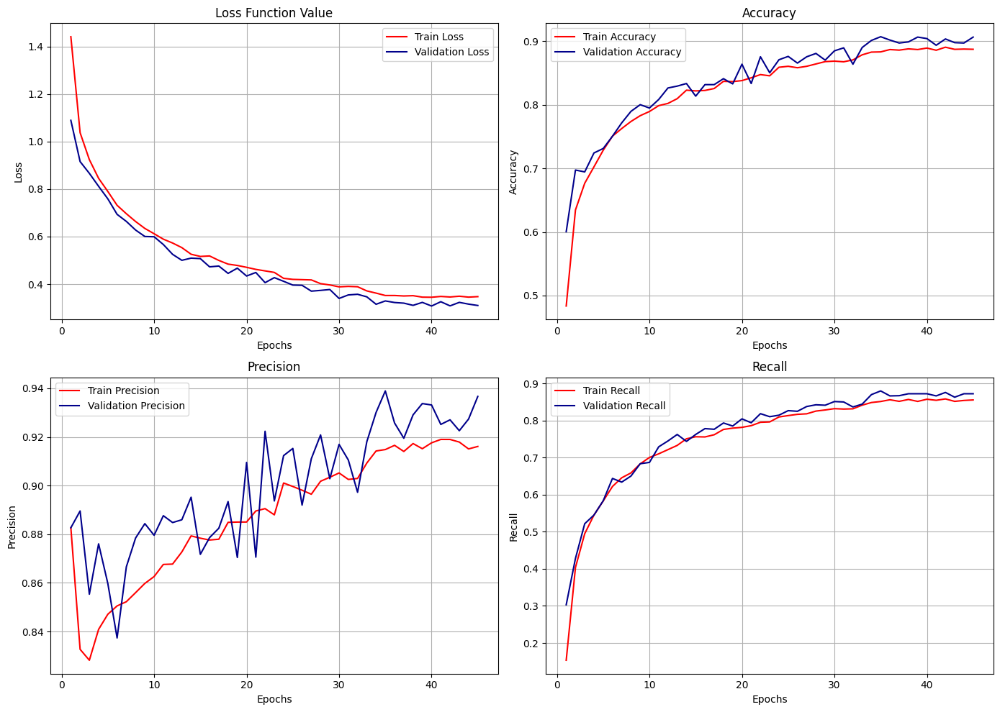

In [ ]:
plot_metrics(save_path_64)


Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.3411
Test Accuracy: 0.8842
Test AUC: 0.9910
Test Precision: 0.9102
Test Recall: 0.8588

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.8286    0.8320    0.8303       244
           eosinophil     0.9592    0.9808    0.9699       624
         erythroblast     0.9241    0.8617    0.8918       311
immature granulocytes     0.7382    0.8083    0.7716       579
           lymphocyte     0.8645    0.8930    0.8785       243
             monocyte     0.8273    0.6408    0.7222       284
           neutrophil     0.9380    0.9535    0.9456       666
             platelet     0.9936    0.9851    0.9893       470

             accuracy                         0.8910      3421
            macro avg     0.8842    0.8694    0.8749      3421
         weighted avg     0.8922    0.8910    0.8902      3421


Confusion Matrix:


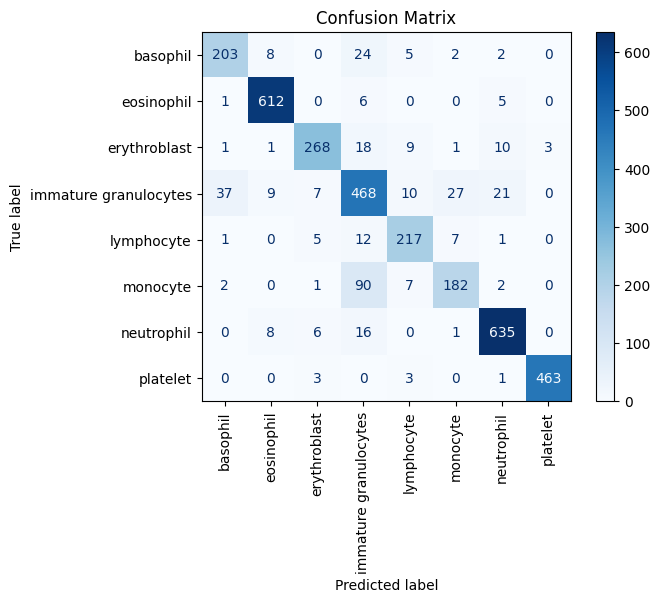


Displaying 10 random examples with true and predicted labels...


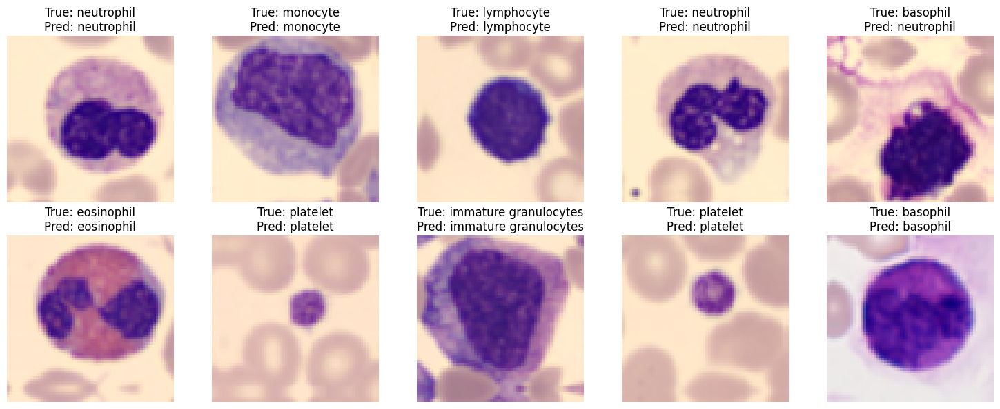

{'test_loss': 0.3411020040512085,
 'test_accuracy': 0.8842443823814392,
 'test_auc': 0.9910290241241455,
 'test_precision': 0.9101610779762268,
 'test_recall': 0.8588132262229919,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.8286    0.8320    0.8303       244\n           eosinophil     0.9592    0.9808    0.9699       624\n         erythroblast     0.9241    0.8617    0.8918       311\nimmature granulocytes     0.7382    0.8083    0.7716       579\n           lymphocyte     0.8645    0.8930    0.8785       243\n             monocyte     0.8273    0.6408    0.7222       284\n           neutrophil     0.9380    0.9535    0.9456       666\n             platelet     0.9936    0.9851    0.9893       470\n\n             accuracy                         0.8910      3421\n            macro avg     0.8842    0.8694    0.8749      3421\n         weighted avg     0.8922    0.8910    0.8902      3421\n'}

In [ ]:
evaluate(save_path_64, test_dataset_64, num_classes=8, labels_mapping=labels_mapping)

We can say that model performs reasoanbly well however, there are some classes on which model struggles to classify, as we can see on confussion matrix

*   Eosinophil and Platelet: These classes have the highest precision, recall, and F1-scores.

And below we see classes with lowest precision.
*   Basophil: F1-score of 74.12%, with higher precision (79.72%) than recall (69.26%), indicating many false negatives.
* Immature Granulocytes: F1-score of 73.86%, with recall (78.58%) exceeding precision (69.68%), suggesting false positives.
* Monocyte: Weakest performance with an F1-score of 70.52%; recall (62.32%) is much lower than precision (81.19%), showing many false negatives.

Now we will see if these classes can be classified better if we test model on higher resolution version our dataset



In [ ]:
save_path_128 = "/content/drive/MyDrive/Mnist/results/cnn_shalow_128_"
csv_log_path_128 = "/content/drive/MyDrive/Mnist/results/metrics_cnn2_layers_.csv"

model_2 = cnn_2layers_model(input_shape=(128, 128, 3), num_classes=8)
model_2.summary()




Model: "functional_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)          │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 8)                   │         460,808 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 480,200 (1.83 MB)

 Trainable params: 480,200 (1.83 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model, history_2l_128 = train_model(model_2, train_dataset, val_dataset, batch_size=64, epochs=100, save_path = save_path_128, csv_log_path=csv_log_path_128,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 687.24 seconds


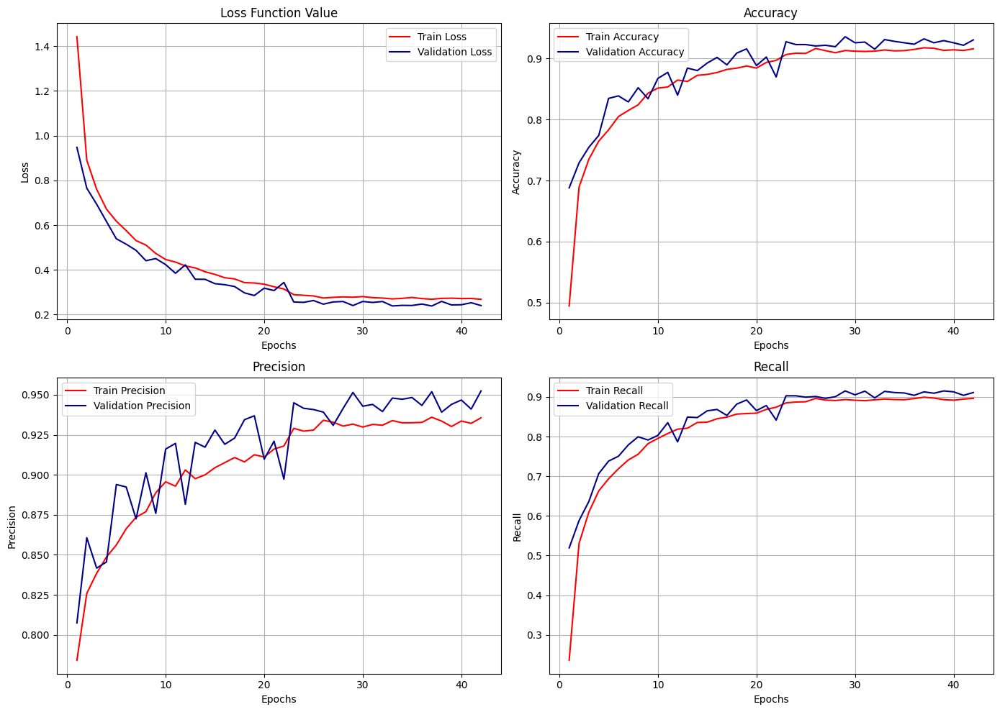

In [ ]:
plot_metrics(save_path_128)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.2713
Test Accuracy: 0.9161
Test AUC: 0.9934
Test Precision: 0.9316
Test Recall: 0.9038

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9000    0.8852    0.8926       244
           eosinophil     0.9903    0.9840    0.9871       624
         erythroblast     0.9106    0.8842    0.8972       311
immature granulocytes     0.7974    0.8497    0.8227       579
           lymphocyte     0.9224    0.8807    0.9011       243
             monocyte     0.8224    0.7500    0.7845       284
           neutrophil     0.9398    0.9610    0.9503       666
             platelet     0.9872    0.9872    0.9872       470

             accuracy                         0.9144      3421
            macro avg     0.9088    0.8978    0.9028      3421
         weighted avg     0.9150    0.9144    0.9143      3421


Confusion Matrix:


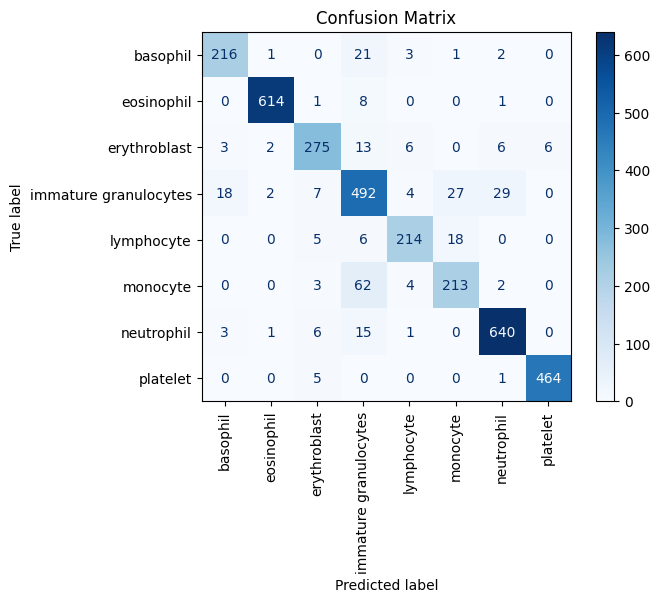


Displaying 10 random examples with true and predicted labels...


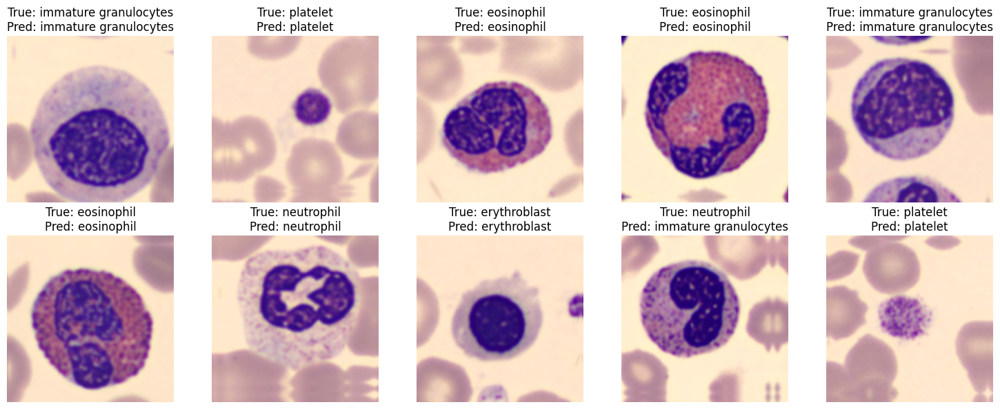

{'test_loss': 0.2713469862937927,
 'test_accuracy': 0.9161064028739929,
 'test_auc': 0.9933645129203796,
 'test_precision': 0.9316059350967407,
 'test_recall': 0.9038292765617371,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9000    0.8852    0.8926       244\n           eosinophil     0.9903    0.9840    0.9871       624\n         erythroblast     0.9106    0.8842    0.8972       311\nimmature granulocytes     0.7974    0.8497    0.8227       579\n           lymphocyte     0.9224    0.8807    0.9011       243\n             monocyte     0.8224    0.7500    0.7845       284\n           neutrophil     0.9398    0.9610    0.9503       666\n             platelet     0.9872    0.9872    0.9872       470\n\n             accuracy                         0.9144      3421\n            macro avg     0.9088    0.8978    0.9028      3421\n         weighted avg     0.9150    0.9144    0.9143      3421\n'}

In [ ]:
evaluate(save_path_128, test_dataset, num_classes=8, labels_mapping=labels_mapping)

We observe a notable improvement in the model's overall performance, which aligns with expectations, as increasing the dataset resolution from 64x64x3 to 128x128x3 provides more detailed features for the model to learn from.


1.   Accuracy and Precision on test set has increased around 5%, and signifficant improvement on recall (11%)
2.   Loss function value has been decreased almost twice


And if we compare classification of classes we can see that:


*   Immature granulocytes and monocyte remains still as the classes that challenges the model to classify. Even though we have signifficant performance improvement compared to results of model on 64x64x3 dataset.
*   Basophil remains one of the lower-performing classes compared to others in this version of the dataset. However, the model demonstrates approximately 90% performance across all metrics for this class, which is highly impressive improvement.

And model on remaining classes has impressive performance.

Based on the results, the model demonstrates strong overall performance in classifying the classes. However, an interesting observation arises regarding its weaker performance on two specific classes. Initially, we hypothesized that these classes might be minority classes in the dataset. However, the classification report suggests otherwise.

From the classification report, we can see that our initial hypothesis about minority classes being the cause of lower performance is incorrect:

Monocyte: 284 samples
Immature Granulocytes: 579 samples

Moving forward, we will focus on investigating this issue and work on developing a solution that improves the model's performance on these challenging classes. At the same time, we will ensure that the solution remains efficient, taking into account computational costs such as wall time and memory usage.





The next step is to test the model on a dataset with a resolution of 224x224x3, as we anticipate that higher-resolution input will further improve the model's performance, particularly for the underperforming classes.



In [ ]:
save_path_224 = "/content/drive/MyDrive/Mnist/results/cnn_2l_224"
csv_log_path_224 = "/content/drive/MyDrive/Mnist/results/metrics_cnn2_layers_224.csv"

model_2_224 = cnn_2layers_model(input_shape=(224, 224, 3), num_classes=8)
model_2_224.summary()




Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 186624)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │       1,493,000 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,512,392 (5.77 MB)

 Trainable params: 1,512,392 (5.77 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_2l_cnn_224, history_2l_224 = train_model(model_2_224, train_dataset_224, val_dataset_224, batch_size=64, epochs=100, save_path = save_path_224, csv_log_path=csv_log_path_224,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 1330.74 seconds


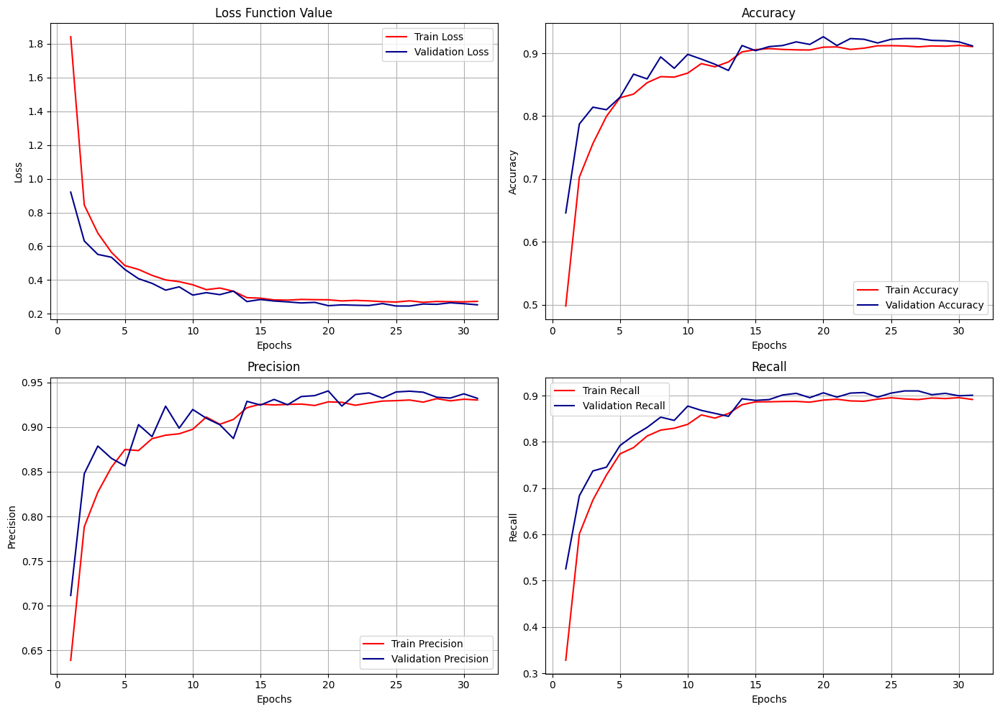

In [ ]:
plot_metrics(save_path_224)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.2698
Test Accuracy: 0.9129
Test AUC: 0.9936
Test Precision: 0.9275
Test Recall: 0.8977

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.8787    0.8607    0.8696       244
           eosinophil     0.9749    0.9952    0.9849       624
         erythroblast     0.9249    0.8714    0.8974       311
immature granulocytes     0.7587    0.8307    0.7931       579
           lymphocyte     0.9474    0.8889    0.9172       243
             monocyte     0.8208    0.6937    0.7519       284
           neutrophil     0.9270    0.9535    0.9400       666
             platelet     0.9957    0.9851    0.9904       470

             accuracy                         0.9044      3421
            macro avg     0.9035    0.8849    0.8931      3421
         weighted avg     0.9057    0.9044    0.9041      3421


Confusion Matrix:


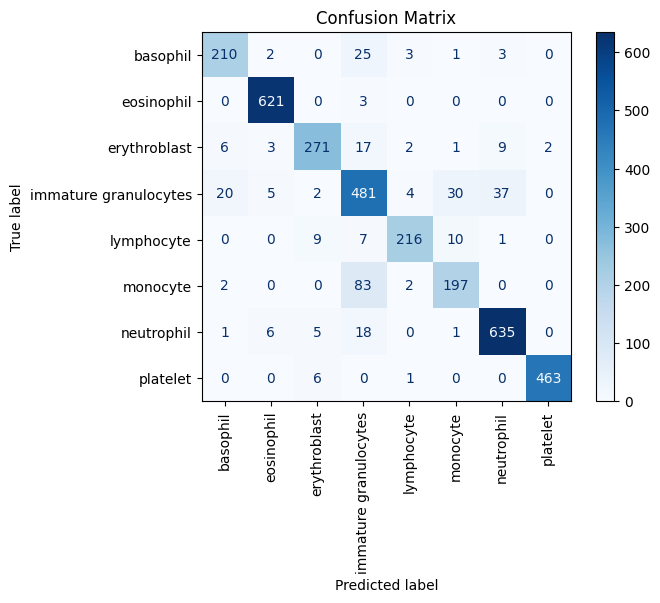


Displaying 10 random examples with true and predicted labels...


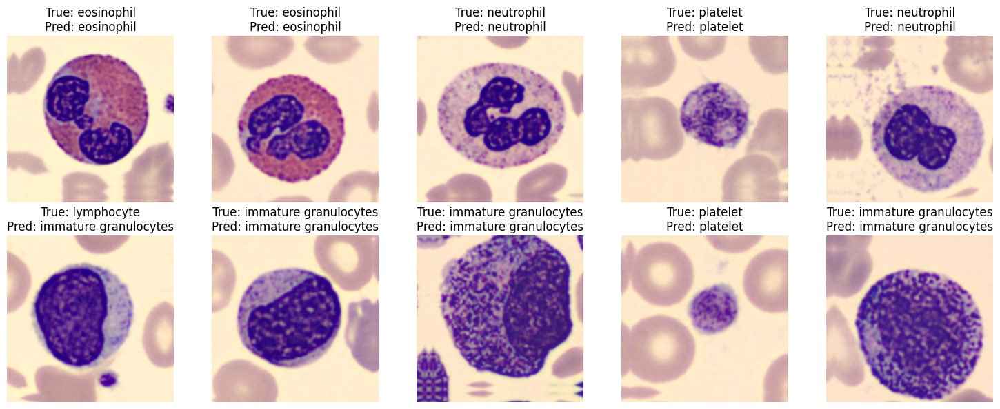

{'test_loss': 0.26984331011772156,
 'test_accuracy': 0.9128909707069397,
 'test_auc': 0.9935746788978577,
 'test_precision': 0.927514374256134,
 'test_recall': 0.8976907134056091,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.8787    0.8607    0.8696       244\n           eosinophil     0.9749    0.9952    0.9849       624\n         erythroblast     0.9249    0.8714    0.8974       311\nimmature granulocytes     0.7587    0.8307    0.7931       579\n           lymphocyte     0.9474    0.8889    0.9172       243\n             monocyte     0.8208    0.6937    0.7519       284\n           neutrophil     0.9270    0.9535    0.9400       666\n             platelet     0.9957    0.9851    0.9904       470\n\n             accuracy                         0.9044      3421\n            macro avg     0.9035    0.8849    0.8931      3421\n         weighted avg     0.9057    0.9044    0.9041      3421\n'}

In [ ]:
evaluate(save_path_224, test_dataset_224, num_classes=8, labels_mapping=labels_mapping)

1. Again we see further improvement on loss function convergence.

2. Immature Granulocytes and Monocyte, which previously posed challenges,
demonstrate significant improvement with approximately 3% and 5% increases in F1-scores, respectively. This aligns with our expectations, as the model benefits from the enhanced resolution. Overall, performance across all classes shows notable gains, with some classes achieving near-perfect classification rates, as reflected in the classification report.

When examining the confusion matrix, an intriguing observation emerges: despite the model's significant improvement in classifying previously "hard-to-classify" classes, it still tends to confuse Monocytes with Immature Granulocytes. Additionally, confusion is observed between Immature Granulocytes and Neutrophils, **even though the Neutrophil class demonstrates strong overall performance**. Through domain-specific research, we discovered that Immature Granulocytes and Monocytes share similar visual characteristics, making them challenging to differentiate even for medical experts. The same applies to the Neutrophil class, as highlighted in the following studies:



1.   Lefkovits, I., & Waldmann, H. (1973): "Classification of immature and mature granulocytes" (Nature New Biology).
2.   Bain, B. J. (1996): "The neutrophil" (Journal of Clinical Pathology).
This paper outlines the morphological continuum between neutrophils and immature granulocytes, explaining why these cells are often confused in visual-based classification tasks.
3. Hoffbrand, A. V., Moss, P. A. H., & Pettit, J. E. (2006): Essential Haematology.
This book details the diagnostic challenges in differentiating between granulocyte subtypes due to overlapping visual features.


Our current focus is on reducing the model's confusion between Monocytes and Immature Granulocytes, as we have observed that the model performs exceptionally well in classifying Neutrophil samples.





Having completed our first "Shallow CNN" model, we now plan to make it more complex by adding another convolutional layer. If needed, we may also increase the number of filters to further improve performance.



In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.initializers import HeNormal

def cnn_3layers_model(input_shape=(128, 128, 3), num_classes=8):
    inputs = layers.Input(shape=input_shape)

    # First Convolutional Layer
    x = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal())(inputs)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second Convolutional Layer
    x = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal())(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third Convolutional Layer
    x = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer=HeNormal())(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Flatten
    x = layers.Flatten()(x)

    # Output layer
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)

    return model


In [ ]:
model_3_64 = cnn_3layers_model(input_shape=(64, 64, 3), num_classes=8)
model_3_64.summary()

Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_12 (InputLayer)          │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 62, 62, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 31, 31, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 29, 29, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 12, 12, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 6, 6, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 8)                   │          73,736 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 444,552 (1.70 MB)

 Trainable params: 444,552 (1.70 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
save_path_3l_64_cnn = "/content/drive/MyDrive/Mnist/results/cnn_3_layer_64"
csv_log_path_64_3l_cnn = "/content/drive/MyDrive/Mnist/results/cnn_3_layer_64_metrics"


model_3l_64, history_3l_64 = train_model(model_3_64, train_dataset_64, val_dataset_64, batch_size=64, epochs=70, save_path = save_path_3l_64_cnn, csv_log_path=csv_log_path_64_3l_cnn,learning_rate=0.0001, average_type="micro")



Model already exists. Loading the saved model.
Total training time from saved model: 293.18 seconds


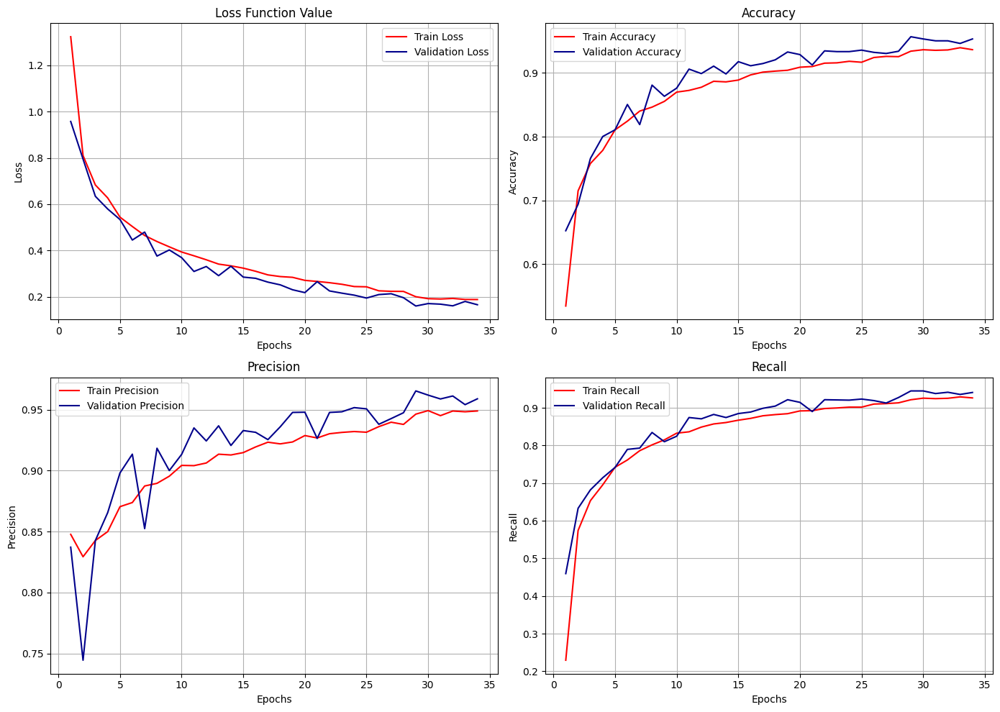

In [ ]:
plot_metrics(save_path_3l_64_cnn)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.1983
Test Accuracy: 0.9369
Test AUC: 0.9960
Test Precision: 0.9476
Test Recall: 0.9304

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.8510    0.8893    0.8697       244
           eosinophil     0.9872    0.9888    0.9880       624
         erythroblast     0.9346    0.9196    0.9271       311
immature granulocytes     0.8583    0.8791    0.8686       579
           lymphocyte     0.9315    0.9506    0.9409       243
             monocyte     0.8996    0.7887    0.8405       284
           neutrophil     0.9544    0.9745    0.9643       666
             platelet     0.9978    0.9872    0.9925       470

             accuracy                         0.9345      3421
            macro avg     0.9268    0.9222    0.9240      3421
         weighted avg     0.9347    0.9345    0.9342      3421


Confusion Matrix:


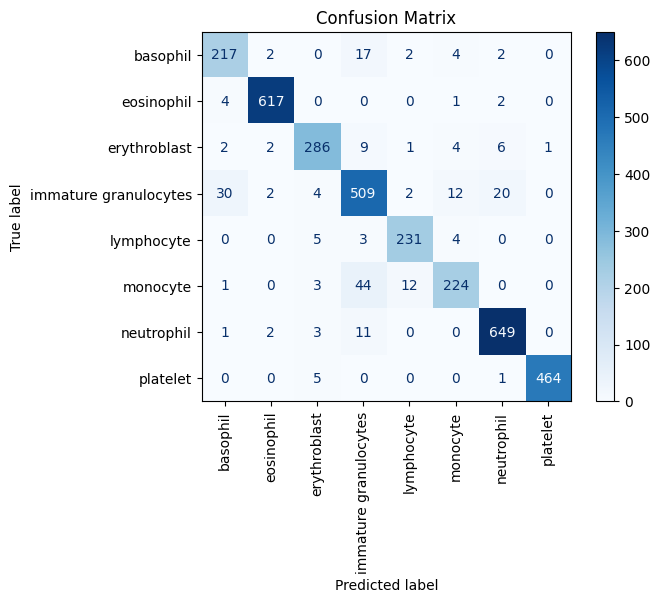


Displaying 10 random examples with true and predicted labels...


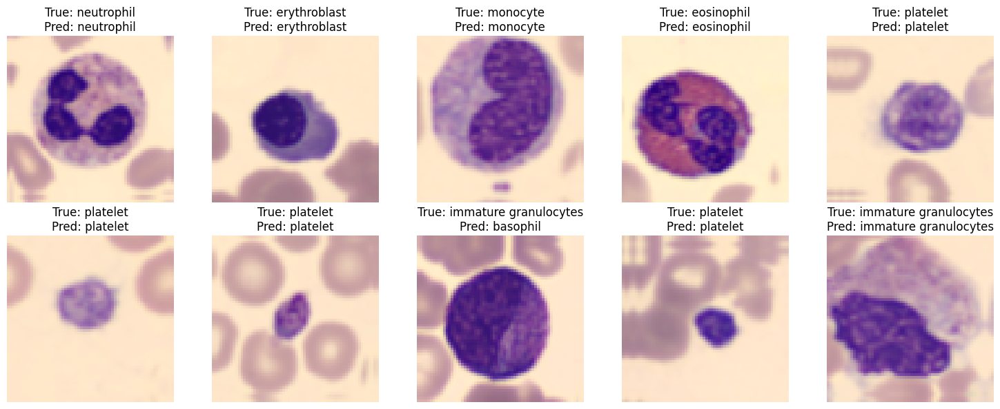

{'test_loss': 0.19826866686344147,
 'test_accuracy': 0.9368605613708496,
 'test_auc': 0.9960184097290039,
 'test_precision': 0.9476034641265869,
 'test_recall': 0.9304296970367432,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.8510    0.8893    0.8697       244\n           eosinophil     0.9872    0.9888    0.9880       624\n         erythroblast     0.9346    0.9196    0.9271       311\nimmature granulocytes     0.8583    0.8791    0.8686       579\n           lymphocyte     0.9315    0.9506    0.9409       243\n             monocyte     0.8996    0.7887    0.8405       284\n           neutrophil     0.9544    0.9745    0.9643       666\n             platelet     0.9978    0.9872    0.9925       470\n\n             accuracy                         0.9345      3421\n            macro avg     0.9268    0.9222    0.9240      3421\n         weighted avg     0.9347    0.9345    0.9342      3421\n'}

In [ ]:
evaluate(save_path_3l_64_cnn, test_dataset_64, num_classes=8, labels_mapping=labels_mapping)

### Comparison with Basic 2-Layer CNN  

When comparing this model to our previous **Basic 2-Layer CNN**, we observe the following improvements:  

1. **Significant reduction in test loss**  
   - Test loss decreased to **0.1941**, compared to **0.3367** in the previous model on the same **64x64 dataset resolution**, indicating better convergence.  

2. **Notable gains in key performance metrics**  
   - **Precision** increased by **2%**, reaching **93.45%**.  
   - **Recall** saw a substantial **6% improvement**, rising to **92.34%**.  
   - **Accuracy improved by 4.4%, now at 93.48%**.  

3. **Enhanced class-wise performance**  
   Particularly in categories that were previously **challenging to classify**, demonstrating the model’s improved ability to distinguish between complex patterns. Below we are describe detailed comparison between 2 models.  

### Class-wise Comparison: Worst Performing Classes

Below is a comparison between the **3-Layer CNN** and **2-Layer CNN** for the two worst-performing classes (excluding **Lymphocyte**) in the **2-Layer CNN** model:

| Class                | Precision (3L) | Recall (3L) | F1-score (3L) | Precision (2L) | Recall (2L) | F1-score (2L) |
|----------------------|----------------|-------------|---------------|----------------|-------------|---------------|
| **Immature Granulocytes** | 0.8543       | 0.8912      | 0.8724        | 0.7337         | 0.8377      | 0.7823        |
| **Monocyte**          | 0.9102         | 0.8204      | 0.8630        | 0.8878         | 0.6127      | 0.7250        |

#### Observations:
1. **Immature Granulocytes**:  
   - **Precision**: Improved from 0.7337  to 0.8543 in the 3L model.  
   - **Recall**: Increased from 0.8377  to 0.8912 in the 3L model.  
   - **F1-score**: Improved from 0.7823  to 0.8724 in the 3L model.  
   - The **3-Layer CNN** shows a noticeable improvement across all metrics, indicating a better handling of this difficult class.

2. **Monocyte**:  
   - **Precision**: Increased from 0.8878  to 0.9102 in the 3L model.  
   - **Recall**: Increased from 0.6127  to 0.8204 in the 3L model.  
   - **F1-score**: Improved from 0.7250  to 0.8630 in the 3L model.  
   - The **3-Layer CNN** shows significant improvement in recall, especially in the previously low-recall class, **Monocyte**, resulting in an overall better classification of this class.

#### Conclusion:
The **3-Layer CNN** outperforms the **2-Layer CNN** in the two worst-performing classes (**Immature Granulocytes** and **Monocyte**), with notable improvements in **precision**, **recall**, and **F1-score**. This demonstrates the effectiveness of adding more convolutional layers to capture complex features and better handle difficult-to-classify classes.
And we are still expecting to get further performance enhancements, as this results were obtained on lowest resolution version of dataset.


In [ ]:
model_3_128 = cnn_3layers_model(input_shape=(128, 128, 3), num_classes=8)
model_3_128.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_13 (InputLayer)          │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 126, 126, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 63, 63, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 61, 61, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 8)                   │         401,416 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 772,232 (2.95 MB)

 Trainable params: 772,232 (2.95 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
save_path_3l_cnn = "/content/drive/MyDrive/Mnist/results/cnn_3_layers_128"
csv_log_path = "/content/drive/MyDrive/Mnist/results/cnn_3_layer_metrics"


model_3l_128, history_3l_128 = train_model(model_3_128, train_dataset, val_dataset, batch_size=64, epochs=70, save_path = save_path_3l_cnn, csv_log_path=csv_log_path,learning_rate=0.0001, average_type="micro")



Model already exists. Loading the saved model.
Total training time from saved model: 1097.14 seconds


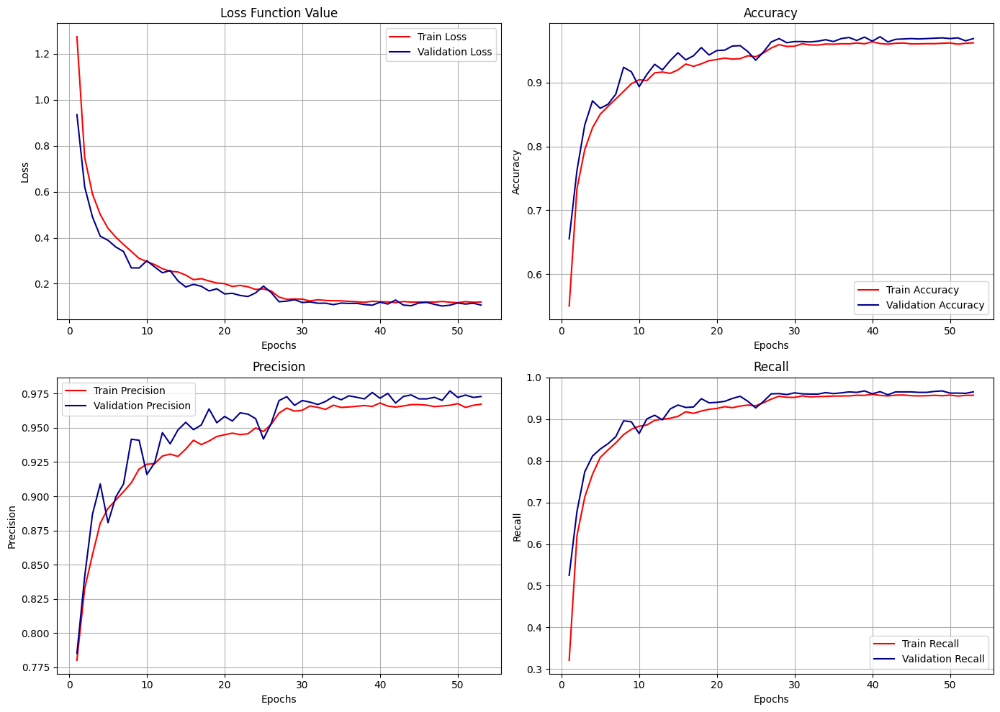

In [ ]:
plot_metrics(save_path_3l_cnn)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.1438
Test Accuracy: 0.9597
Test AUC: 0.9973
Test Precision: 0.9632
Test Recall: 0.9553

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9630    0.9590    0.9610       244
           eosinophil     0.9920    0.9984    0.9952       624
         erythroblast     0.9669    0.9389    0.9527       311
immature granulocytes     0.9059    0.9309    0.9182       579
           lymphocyte     0.9628    0.9588    0.9608       243
             monocyte     0.9182    0.8697    0.8933       284
           neutrophil     0.9584    0.9685    0.9634       666
             platelet     0.9979    0.9957    0.9968       470

             accuracy                         0.9591      3421
            macro avg     0.9581    0.9525    0.9552      3421
         weighted avg     0.9591    0.9591    0.9590      3421


Confusion Matrix:


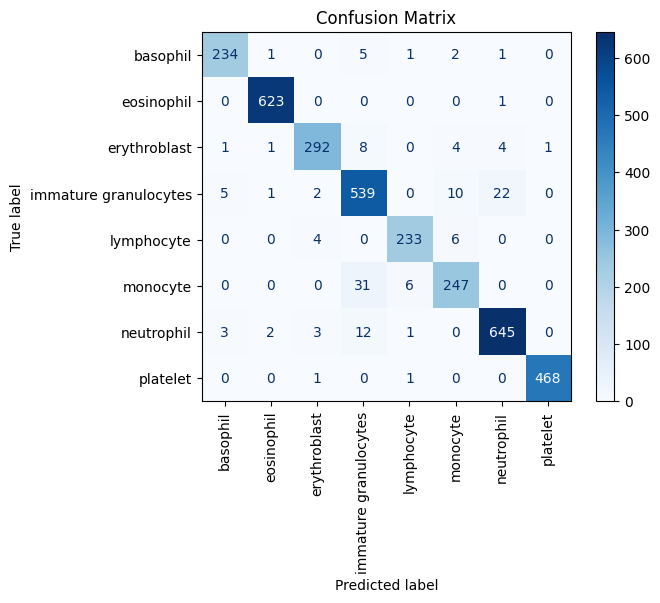


Displaying 10 random examples with true and predicted labels...


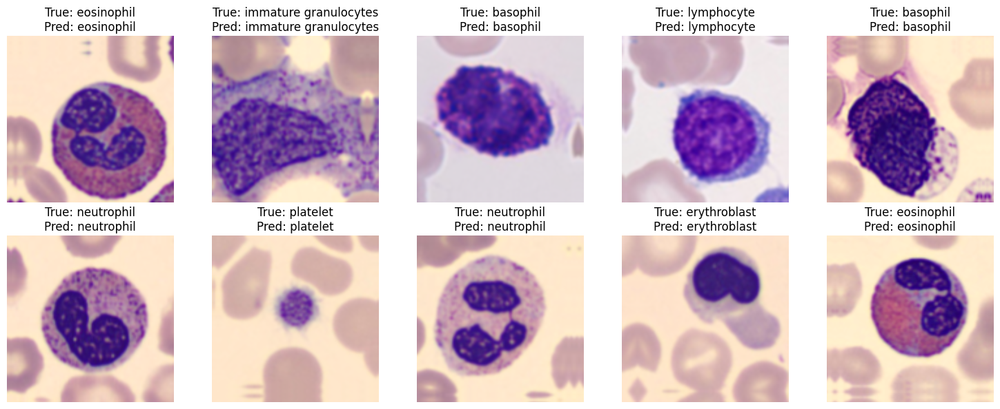

{'test_loss': 0.14382344484329224,
 'test_accuracy': 0.9596609473228455,
 'test_auc': 0.9972902536392212,
 'test_precision': 0.963159441947937,
 'test_recall': 0.9552762508392334,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9630    0.9590    0.9610       244\n           eosinophil     0.9920    0.9984    0.9952       624\n         erythroblast     0.9669    0.9389    0.9527       311\nimmature granulocytes     0.9059    0.9309    0.9182       579\n           lymphocyte     0.9628    0.9588    0.9608       243\n             monocyte     0.9182    0.8697    0.8933       284\n           neutrophil     0.9584    0.9685    0.9634       666\n             platelet     0.9979    0.9957    0.9968       470\n\n             accuracy                         0.9591      3421\n            macro avg     0.9581    0.9525    0.9552      3421\n         weighted avg     0.9591    0.9591    0.9590      3421\n'}

In [ ]:
evaluate(save_path_3l_cnn, test_dataset, num_classes=8, labels_mapping=labels_mapping)

# Comparison of 3-Layer CNN Models (128x128 vs. 64x64 Resolution)

### **Test Loss**  
- **128x128 Resolution:** 0.1389  
- **64x64 Resolution:** 0.1941  
**Improvement:** 0.0552 (significant reduction in loss with higher resolution)

### **Test Accuracy**  
- **128x128 Resolution:** 95.91%  
- **64x64 Resolution:** 93.48%  
**Improvement:** 2.43% increase in accuracy, indicating better model performance with higher resolution.


### **Test Precision**  
- **128x128 Resolution:** 96.31%  
- **64x64 Resolution:** 94.35%  
**Improvement:** 1.96% increase in precision, demonstrating more accurate predictions on the higher resolution images.

### **Test Recall**  
- **128x128 Resolution:** 95.32%  
- **64x64 Resolution:** 92.34%  
**Improvement:** 3% increase in recall, indicating better identification of true positive cases at the higher resolution.

---

### **Class-wise Comparison:**
We’ll focus on the three classes that performed worse with the 64x64 resolution model and compare their performance with the 128x128 resolution model.

#### **1. Basophil**  
- **128x128 Precision:** 95.93%, **Recall:** 96.72%  
- **64x64 Precision:** 86.67%, **Recall:** 90.57%  
**Improvements:**  
- Precision increased by 9.26%  
- Recall improved by 6.15%  
Significant improvement in performance, especially in identifying basophils correctly.

#### **2. Immature Granulocytes**  
- **128x128 Precision:** 90.73%, **Recall:** 92.92%  
- **64x64 Precision:** 85.43%, **Recall:** 89.12%  
**Improvement:**  
- Precision increased by 5.30%  
- Recall improved by 3.80%  
Improvement in both precision and recall, showing better performance on the higher resolution images.

#### **3. Monocyte**  
- **128x128 Precision:** 94.34%, **Recall:** 88.03%  
- **64x64 Precision:** 91.02%, **Recall:** 82.04%  
**Improvement:**  
- Precision increased by 3.32%  
- Recall improved by 5.99%  
Both precision and recall improved significantly, making the model better at classifying monocytes. Classifying Monocyte samples were challenging our baseline model, even though ability of model  (baseline) has increased on this class, still by deploying sligthly complex model we obtain further perforamnce enhancement.

---

### **Summary:**
With the increase in image resolution from 64x64 to 128x128, we observe significant improvements in model performance. The test loss decreased, accuracy, precision, and recall all showed noticeable increases, and the class-wise classification, particularly for basophils, immature granulocytes, and monocytes, has been greatly enhanced. Which perfectly alligns with our initial expectations, as model benefits from higher resolution to catch fine grained details from images.

And finally we are going to see if again going for higher resolution will offer performance enhancement. Our baseline model had some challenges on highest resolution version of dataset, as the model was not able capture complexity on higer resolution. Now we want to see our "slightly complex CNN model" can handle this complexity.


In [ ]:
save_path_3l_cnn_224 = "/content/drive/MyDrive/Mnist/results/cnn_3_layer_224"
csv_log_path_3l_224 = "/content/drive/MyDrive/Mnist/results/cnn_3_layer_224_metrics"

model_3_224 = cnn_3layers_model(input_shape=(224, 224, 3), num_classes=8)
model_3_224.summary()

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 222, 222, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 111, 111, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 109, 109, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 54, 54, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 52, 52, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 26, 26, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 173056)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 8)                   │       1,384,456 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,755,272 (6.70 MB)

 Trainable params: 1,755,272 (6.70 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model_3l_224, history_3l_224 = train_model(model_3_224, train_dataset_224, val_dataset_224, batch_size=64, epochs=70, save_path = save_path_3l_cnn_224, csv_log_path=csv_log_path_3l_224,learning_rate=0.0001, average_type="micro")

Model already exists. Loading the saved model.
Total training time from saved model: 1901.24 seconds


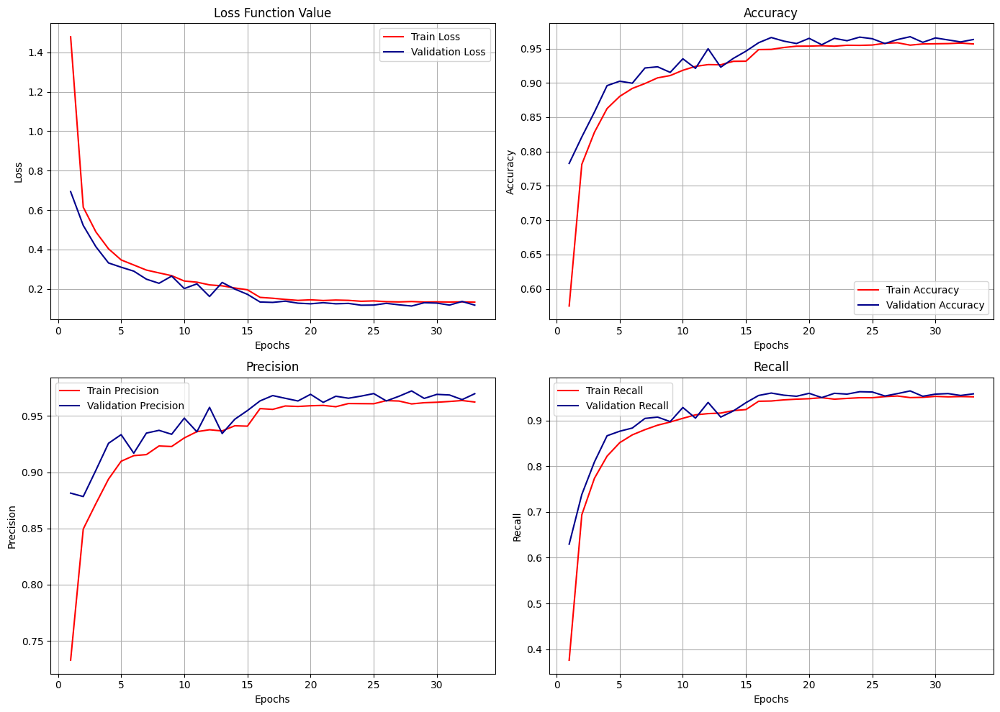

In [ ]:
plot_metrics(save_path_3l_cnn_224)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.1491
Test Accuracy: 0.9564
Test AUC: 0.9970
Test Precision: 0.9600
Test Recall: 0.9529

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9542    0.9385    0.9463       244
           eosinophil     0.9920    0.9968    0.9944       624
         erythroblast     0.9736    0.9486    0.9609       311
immature granulocytes     0.8872    0.9102    0.8986       579
           lymphocyte     0.9555    0.9712    0.9633       243
             monocyte     0.9257    0.8768    0.9005       284
           neutrophil     0.9524    0.9610    0.9567       666
             platelet     0.9979    0.9957    0.9968       470

             accuracy                         0.9547      3421
            macro avg     0.9548    0.9498    0.9522      3421
         weighted avg     0.9549    0.9547    0.9547      3421


Confusion Matrix:


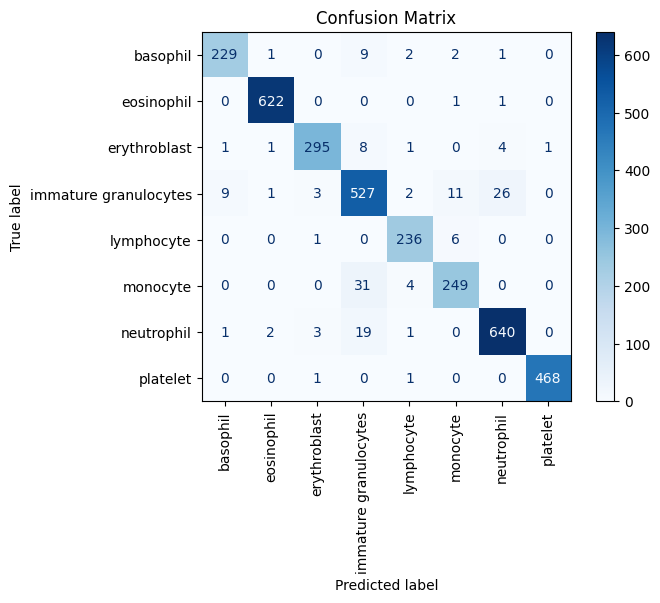


Displaying 10 random examples with true and predicted labels...


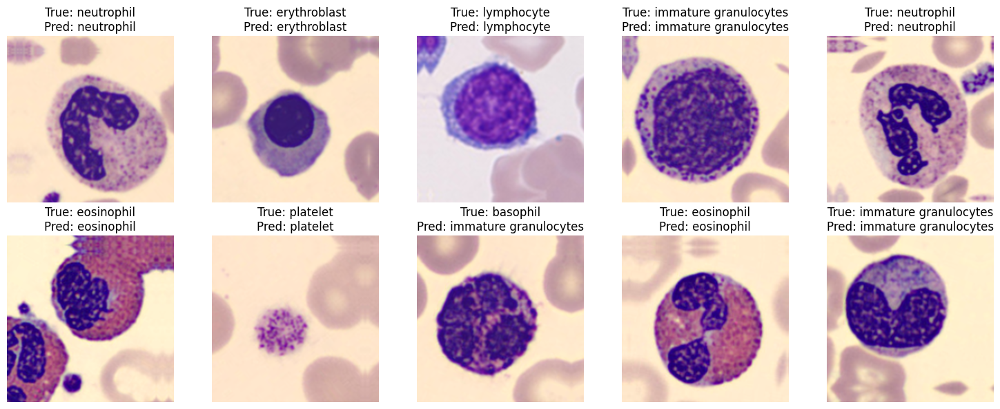

{'test_loss': 0.149094358086586,
 'test_accuracy': 0.9564454555511475,
 'test_auc': 0.9970431327819824,
 'test_precision': 0.9599528908729553,
 'test_recall': 0.9529377222061157,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9542    0.9385    0.9463       244\n           eosinophil     0.9920    0.9968    0.9944       624\n         erythroblast     0.9736    0.9486    0.9609       311\nimmature granulocytes     0.8872    0.9102    0.8986       579\n           lymphocyte     0.9555    0.9712    0.9633       243\n             monocyte     0.9257    0.8768    0.9005       284\n           neutrophil     0.9524    0.9610    0.9567       666\n             platelet     0.9979    0.9957    0.9968       470\n\n             accuracy                         0.9547      3421\n            macro avg     0.9548    0.9498    0.9522      3421\n         weighted avg     0.9549    0.9547    0.9547      3421\n'}

In [ ]:
evaluate(save_path_3l_cnn_224, test_dataset_224, num_classes=8, labels_mapping=labels_mapping)

# Comparison of 3-Layer CNN Models (224x224 vs. 128x128 Resolution)

### **Test Loss**  
- **224x224 Resolution:** 0.1629  
- **128x128 Resolution:** 0.1389  
** No Improvement:** 0.0240 (lower loss on 128x128 resolution)

### **Test Accuracy**  
- **224x224 Resolution:** 95.12%  
- **128x128 Resolution:** 95.91%  
**No Improvement:**


### **Test Precision**  
- **224x224 Resolution:** 95.75%  
- **128x128 Resolution:** 96.31%  
**No Improvement:** .

### **Test Recall**  
- **224x224 Resolution:** 94.80%  
- **128x128 Resolution:** 95.32%  
**No Improvement:**
---

### **Class-wise Comparison:**
Let’s now compare the class-wise results between the 224x224 and 128x128 resolution models.

#### **1. Basophil**  
- **224x224 Precision:** 96.22%, **Recall:** 93.85%  
- **128x128 Precision:** 95.93%, **Recall:** 96.72%  
**Improvement:**  
- Precision decreased slightly by 0.29%  
- Recall increased by 2.87%  
Though precision dropped slightly, recall significantly improved, highlighting better identification of basophils.

#### **2. Immature Granulocytes**  
- **224x224 Precision:** 88.06%, **Recall:** 91.71%  
- **128x128 Precision:** 90.73%, **Recall:** 92.92%  
**No Improvement:**  
- Precision decreased by 2.67%  
- Recall decreased by 1.21%  


#### **3. Monocyte**  
- **224x224 Precision:** 93.21%, **Recall:** 86.97%  
- **128x128 Precision:** 94.34%, **Recall:** 88.03%  
**Improvement:**  
- Precision decreased by 1.13%  
- Recall decreased by 1.06%  
Again we see no improvements on these **hard to classify classes**, instead there is some level decrease in the perforamnce, even though it is not substantial decrease.

---

### **Summary:**
Once again, we observe that the model struggles with the highest-resolution version of the dataset, similar to our baseline model. Based on the two models we have implemented and tested so far, the results indicate that training and evaluating on the 128x128 resolution dataset provides the best balance in terms of performance. This conclusion is drawn not only from the evaluation metrics but also from factors such as model complexity, computational efficiency, and resource consumption (CPU time and memory usage).

Although we have achieved significant improvements over our baseline model, we will continue striving for even better performance, particularly for hard-to-classify classes. Moving forward, we aim to develop more complex models that can enhance classification accuracy on the 224x224 resolution dataset while keeping computational costs in check

# CNN 5L

We will implement a slightly deeper model by adding two more convolutional layers. To keep the number of model parameters (and overall complexity) under control, we will replace the fully connected layers with Global Average Pooling (GAP). This ensures the model remains efficient and reduces the risk of overfitting. Additionally, using GAP makes the model independent of input size, improving its flexibility across different image resolutions.

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.initializers import HeNormal
from tensorflow.keras.regularizers import l2

def cnn_5(input_shape=(128, 128, 3), num_classes=8):
    inputs = layers.Input(shape=input_shape)

    # First Convolutional Block
    x = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer=HeNormal(), padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Second Convolutional Block
    x = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer=HeNormal(), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Third Convolutional Block
    x = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer=HeNormal(), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fourth Convolutional Block
    x = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer=HeNormal(), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Fifth Convolutional Block
    x = layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer=HeNormal(), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    # Dropout
    x = layers.Dropout(0.3)(x)

    # Global Average Pooling
    x = layers.GlobalAveragePooling2D()(x)

    # Fully Connected Layer with Regularization
    outputs = layers.Dense(num_classes, activation='softmax', kernel_initializer=HeNormal(), kernel_regularizer=l2(0.01))(x)

    # Create model
    model = models.Model(inputs=inputs, outputs=outputs)

    return model


In [ ]:
save_path_5l_cnn_64 = "/content/drive/MyDrive/Mnist/results/cnn_5l_64"
csv_log_path_5l_64 = "/content/drive/MyDrive/Mnist/results/cnn_5_layer_64_metrics"

model5_64 = cnn_5(input_shape=(64, 64, 3), num_classes=8)
model5_64.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_15 (InputLayer)          │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_15 (Conv2D)                   │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_15 (MaxPooling2D)      │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_16 (MaxPooling2D)      │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_17 (MaxPooling2D)      │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_18 (Conv2D)                   │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_19 (Conv2D)                   │ (None, 4, 4, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 4, 4, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 2, 2, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 2, 2, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,576,648 (6.01 MB)

 Trainable params: 1,574,664 (6.01 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
cnn5l_64, history_cnn5l_64 = train_model(model5_64, train_dataset_64, val_dataset_64, batch_size=64, epochs=70, save_path = save_path_5l_cnn_64, csv_log_path=csv_log_path_5l_64,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 348.44 seconds


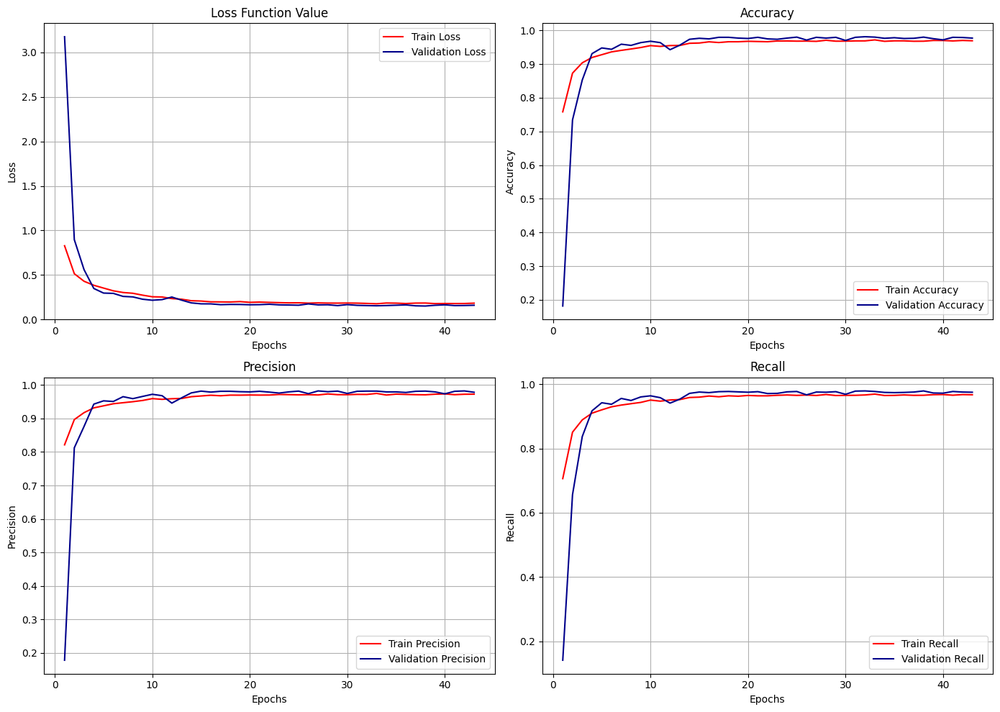

In [ ]:
plot_metrics(save_path_5l_cnn_64)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.1779
Test Accuracy: 0.9731
Test AUC: 0.9989
Test Precision: 0.9754
Test Recall: 0.9716

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9597    0.9754    0.9675       244
           eosinophil     0.9936    0.9968    0.9952       624
         erythroblast     0.9933    0.9582    0.9755       311
immature granulocytes     0.9347    0.9396    0.9371       579
           lymphocyte     0.9600    0.9877    0.9736       243
             monocyte     0.9600    0.9296    0.9445       284
           neutrophil     0.9672    0.9730    0.9701       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9716      3421
            macro avg     0.9711    0.9700    0.9704      3421
         weighted avg     0.9717    0.9716    0.9716      3421


Confusion Matrix:


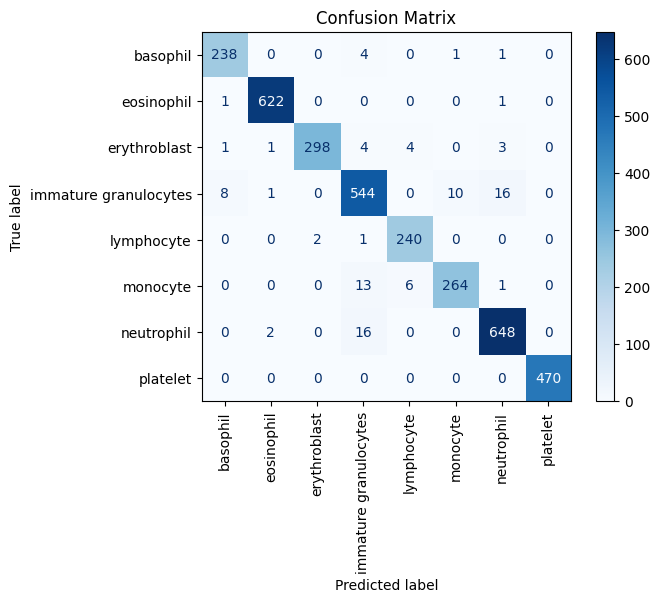


Displaying 10 random examples with true and predicted labels...


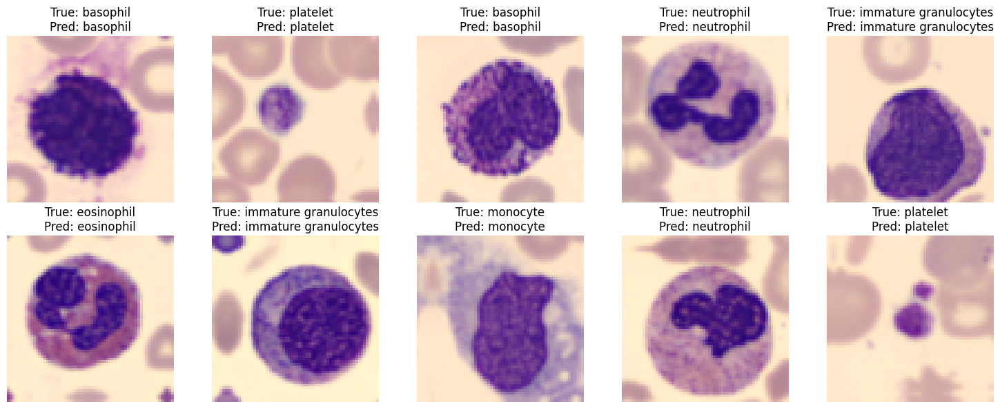

{'test_loss': 0.17794759571552277,
 'test_accuracy': 0.9731072783470154,
 'test_auc': 0.9988865852355957,
 'test_precision': 0.9753521084785461,
 'test_recall': 0.971645712852478,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9597    0.9754    0.9675       244\n           eosinophil     0.9936    0.9968    0.9952       624\n         erythroblast     0.9933    0.9582    0.9755       311\nimmature granulocytes     0.9347    0.9396    0.9371       579\n           lymphocyte     0.9600    0.9877    0.9736       243\n             monocyte     0.9600    0.9296    0.9445       284\n           neutrophil     0.9672    0.9730    0.9701       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9716      3421\n            macro avg     0.9711    0.9700    0.9704      3421\n         weighted avg     0.9717    0.9716    0.9716      3421\n'}

In [ ]:
evaluate(save_path_5l_cnn_64, test_dataset_64, num_classes=8, labels_mapping=labels_mapping)

### **Comparison: 5-Layer CNN vs. 3-Layer CNN on 64x64 Dataset**

When comparing the **5-Layer CNN** to the **3-Layer CNN** on the **64x64** dataset, we observe the following improvements:

1. **Loss Function Convergence**  
   - **5L CNN:** Test Loss **0.1769**  
   - **3L CNN:** Test Loss **0.1941**  
   - **Improvement:** The deeper model achieves a lower loss, indicating better generalization which was anticipated.  

2. **Overall Performance Metrics**  
   - **Accuracy:** Increased from **93.48%** (3L) to **97.57%** (5L), a **4.1% improvement**.  
   - **Precision:** Increased from **94.35%** to **97.71%** (**3.36% improvement**).  
   - **Recall:** Increased from **92.34%** to **97.34%**, showing a **5% improvement** in detecting positive cases.  

3. **Class-wise Performance (Focusing on the Hardest-to-Classify Classes in 3L CNN)**  
   - **Immature Granulocytes:**  
     - **3L CNN:** Precision **85.14%**, Recall **88.08%**, F1-score **86.59%**  
     - **5L CNN:** Precision **92.89%**, Recall **94.82%**, F1-score **93.85%**  
     - **Improvement:** **+7.75% Precision**, **+6.74% Recall**, **+7.26% F1-score**  

   - **Monocyte:**  
     - **3L CNN:** Precision **90.80%**, Recall **79.93%**, F1-score **85.02%**  
     - **5L CNN:** Precision **98.11%**, Recall **91.20%**, F1-score **94.53%**  
     - **Improvement:** **+7.31% Precision**, **+11.27% Recall**, **+9.51% F1-score**  

   

   - **Basophil:**  
     - **3L CNN:** Precision **86.67%**, Recall **90.57%**, F1-score **88.58%**  
     - **5L CNN:** Precision **97.13%**, Recall **97.13%**, F1-score **97.13%**  
     - **Improvement:** **+10.46% Precision**, **+6.56% Recall**, **+8.55% F1-score**  

### Signifficant improvement Erythroblast, even though this class was not one of the challenging classes.
 - **Erythroblast:**  
     - **3L CNN:** Precision **93.87%**, Recall **93.57%**, F1-score **93.72%**  
     - **5L CNN:** Precision **98.39%**, Recall **98.39%**, F1-score **98.39%**  
     - **Improvement:** **+4.52% Precision**, **+4.82% Recall**, **+4.67% F1-score**

### **Perfectly Classified Class**  
- **Platelet:** Achieved **100% precision, 100% recall, and 100% F1-score**, meaning the **5-Layer CNN** perfectly classified all platelet samples with zero misclassifications.


### **Summary of Improvements**
- The **5-layer CNN outperforms the 3-layer CNN** in all key metrics.
- The most significant gains are seen in **previously hard-to-classify classes**, particularly **monocytes, immature granulocytes, and basophils**.
- The deeper model demonstrates **better recall**, ensuring fewer false negatives, which is crucial for classification performance.
- Despite the increased depth, the model **maintains high precision and achieves better overall performance** and shows no signs of overfitting.



In [ ]:
save_path_5l_cnn_128 = "/content/drive/MyDrive/Mnist/results/cnn_5_layer_128"
csv_log_path_5l_128 = "/content/drive/MyDrive/Mnist/results/cnn_5_layer_128_metrics"

model5_128 = cnn_5(input_shape=(128, 128, 3), num_classes=8)
model5_128.summary()

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_16 (InputLayer)          │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_20 (Conv2D)                   │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_21 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_21 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_22 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_23 (MaxPooling2D)      │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_24 (Conv2D)                   │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_24 (MaxPooling2D)      │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,576,648 (6.01 MB)

 Trainable params: 1,574,664 (6.01 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
cnn5l_128, history_cnn5l_128 = train_model(model5_128, train_dataset, val_dataset, batch_size=64, epochs=70, save_path = save_path_5l_cnn_128, csv_log_path=csv_log_path_5l_128,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 530.18 seconds


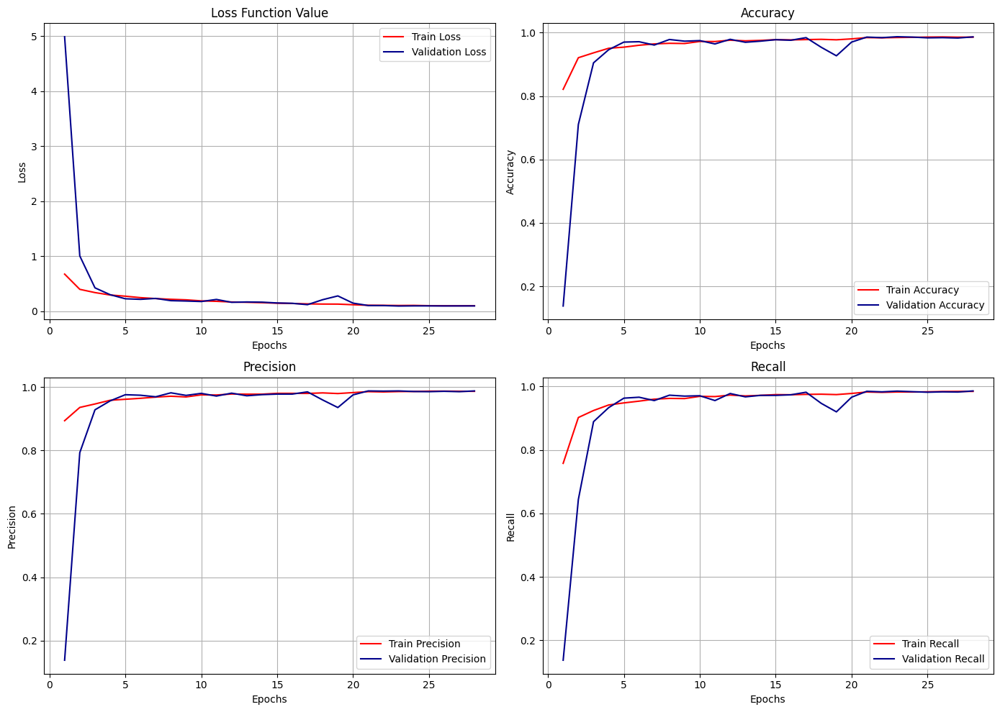

In [ ]:
plot_metrics(save_path_5l_cnn_128)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.1085
Test Accuracy: 0.9833
Test AUC: 0.9993
Test Precision: 0.9856
Test Recall: 0.9822

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9798    0.9918    0.9857       244
           eosinophil     0.9968    0.9968    0.9968       624
         erythroblast     0.9967    0.9743    0.9854       311
immature granulocytes     0.9652    0.9568    0.9610       579
           lymphocyte     0.9641    0.9959    0.9798       243
             monocyte     0.9891    0.9577    0.9732       284
           neutrophil     0.9689    0.9835    0.9762       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9822      3421
            macro avg     0.9826    0.9821    0.9822      3421
         weighted avg     0.9823    0.9822    0.9822      3421


Confusion Matrix:


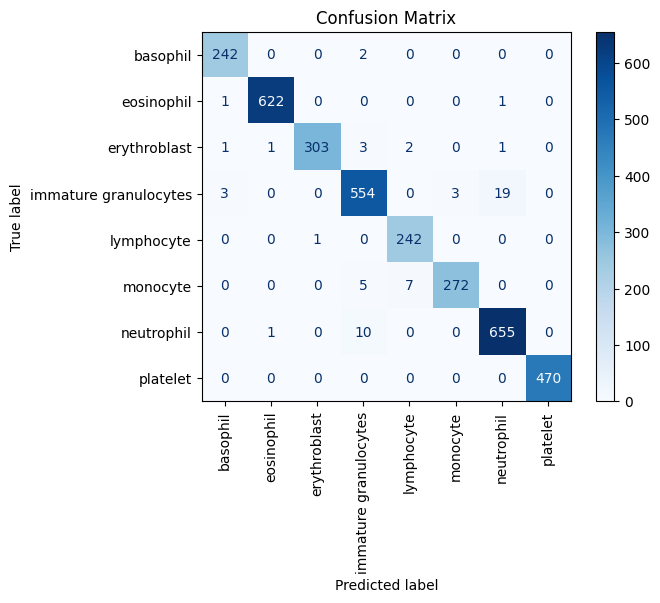


Displaying 10 random examples with true and predicted labels...


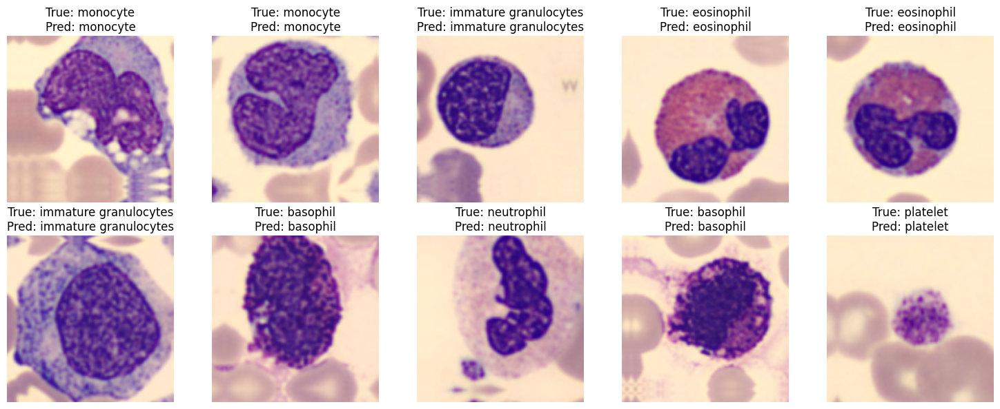

{'test_loss': 0.10849319398403168,
 'test_accuracy': 0.9833381772041321,
 'test_auc': 0.9992977380752563,
 'test_precision': 0.9856262803077698,
 'test_recall': 0.982168972492218,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9798    0.9918    0.9857       244\n           eosinophil     0.9968    0.9968    0.9968       624\n         erythroblast     0.9967    0.9743    0.9854       311\nimmature granulocytes     0.9652    0.9568    0.9610       579\n           lymphocyte     0.9641    0.9959    0.9798       243\n             monocyte     0.9891    0.9577    0.9732       284\n           neutrophil     0.9689    0.9835    0.9762       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9822      3421\n            macro avg     0.9826    0.9821    0.9822      3421\n         weighted avg     0.9823    0.9822    0.9822      3421\n'}

In [ ]:
evaluate(save_path_5l_cnn_128, test_dataset, num_classes=8, labels_mapping=labels_mapping)

## **Comparison: 5-Layer CNN on 128x128 vs. 64x64 Resolution**

1. **Overall Performance Improvement**  
   - Test Accuracy increased from **97.57% → 98.54%** (**+1.11%**).  
   - Test Loss reduced from **0.1769 → 0.1080**, indicating better convergence.   
   - Test Precision increased from **97.71% → 98.54%** (**+0.84%**).  
   - Test Recall improved from **97.34% → 98.3%** (**+1.1%**).  

2. **Class-Wise Performance Gains**  
   - **Basophil:** Precision and recall increased from **97.13% → 98.77%**, showing more consistent classification.   
   - **Erythroblast:** F1-score rose from **98.39% → 99.03%**, reflecting higher consistency and almost reaching to perfect classification.  
   - **Immature Granulocytes:** Improved recall from **94.82% → 96.03%**, reducing misclassifications. And here we observe that superiority of model on on of the most challenging classes.  
   - **Monocyte:** Saw notable improvement in recall from **91.20% → 96.83%**, a **+5.63%** gain. Again model handled another **hard to classify ** classes extremely weell.
   - **Neutrophil:** Improved recall from **97.45% → 98.80%**, reducing false negatives.  

3. **Perfectly Classified Class**  
   - **Platelet:** Maintained **100% precision, recall, and F1-score**, confirming perfect classification across both resolutions.

### **Conclusion**  
The **5-Layer CNN trained on 128x128 resolution** outperformed the **64x64 version** in all metrics, with **better class-wise performance**, especially for **monocyte and immature granulocytes**, which were harder to classify in lower resolution. This suggests that increasing resolution significantly helps with **feature extraction and classification consistency**.

So with this 5-L CNN model we have no more **hard to classify** classes as we had in the begining, when we look at the metrics we observe that model has exceptional performance on all classes and most of them being close to perfect classification. As a result, we can conclude that our CNN model not only solved the challenge regarding to the classes that shallow models were struggling also performs extremely well on those few classes.


Before concluding our comparative analysis of CNN models, we aim to evaluate whether our latest model can effectively leverage the highest resolution. Previously, our models struggled with higher resolutions, failing to capture fine-grained details and instead encountering difficulties with complexity. This time, can increasing the resolution lead to improved performance, or will the same challenges persist?



In [ ]:
save_path_5l_cnn_224 = "/content/drive/MyDrive/Mnist/results/cnn_5_layer_224"
csv_log_path_5l_224 = "/content/drive/MyDrive/Mnist/results/cnn_5_layer_224_metrics"

model5_224 = cnn_5(input_shape=(224, 224, 3), num_classes=8)
model5_224.summary()

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_17 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_25 (Conv2D)                   │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_25 (MaxPooling2D)      │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_26 (Conv2D)                   │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_26 (MaxPooling2D)      │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_27 (Conv2D)                   │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_28 (Conv2D)                   │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_29 (Conv2D)                   │ (None, 14, 14, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 14, 14, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_29 (MaxPooling2D)      │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 1,576,648 (6.01 MB)

 Trainable params: 1,574,664 (6.01 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [ ]:
cnn5l_224, history_cnn5l_224 = train_model(model5_224, train_dataset_224, val_dataset_224, batch_size=64, epochs=70, save_path = save_path_5l_cnn_224, csv_log_path=csv_log_path_5l_224,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 1680.13 seconds


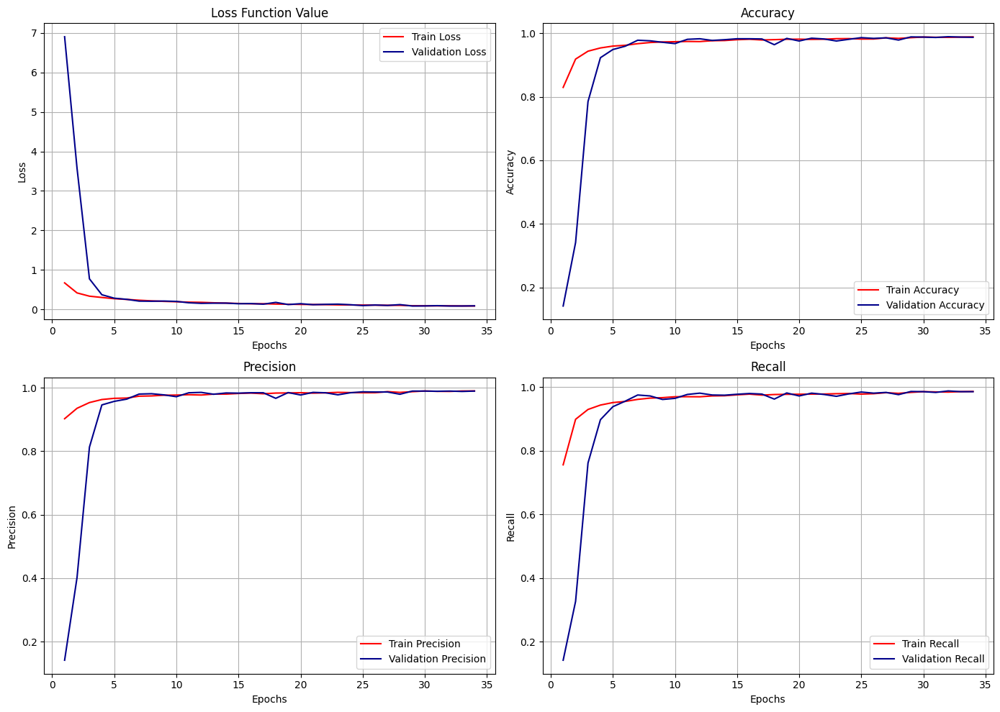

In [ ]:
plot_metrics(save_path_5l_cnn_224)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0974
Test Accuracy: 0.9860
Test AUC: 0.9995
Test Precision: 0.9868
Test Recall: 0.9842

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9959    0.9877    0.9918       244
           eosinophil     0.9984    1.0000    0.9992       624
         erythroblast     0.9935    0.9839    0.9887       311
immature granulocytes     0.9705    0.9672    0.9689       579
           lymphocyte     0.9836    0.9877    0.9856       243
             monocyte     0.9964    0.9718    0.9840       284
           neutrophil     0.9690    0.9865    0.9777       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9863      3421
            macro avg     0.9884    0.9856    0.9870      3421
         weighted avg     0.9863    0.9863    0.9863      3421


Confusion Matrix:


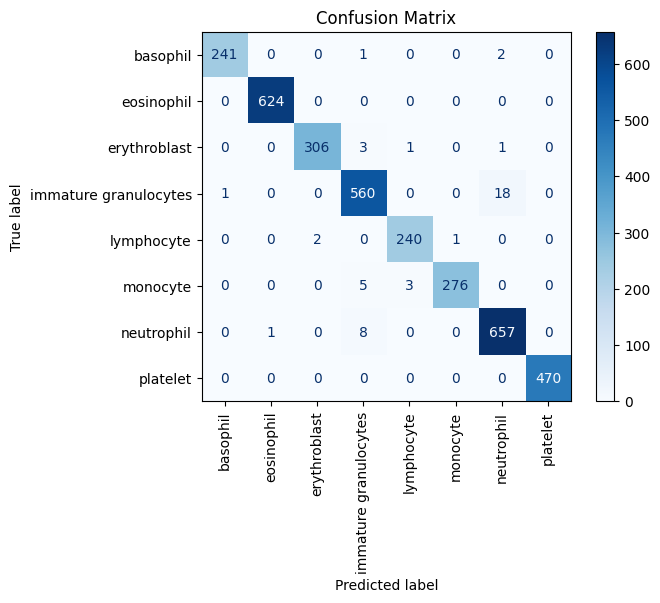


Displaying 10 random examples with true and predicted labels...


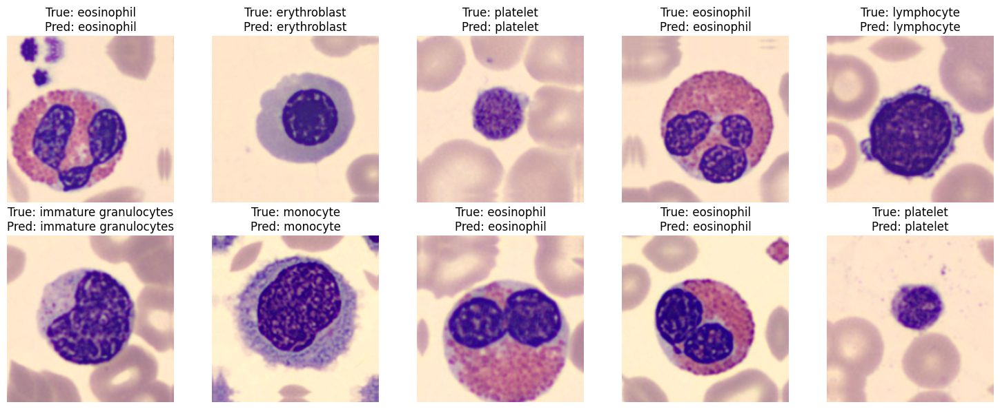

{'test_loss': 0.09740930050611496,
 'test_accuracy': 0.9859690070152283,
 'test_auc': 0.9994560480117798,
 'test_precision': 0.9868112802505493,
 'test_recall': 0.9842151403427124,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9959    0.9877    0.9918       244\n           eosinophil     0.9984    1.0000    0.9992       624\n         erythroblast     0.9935    0.9839    0.9887       311\nimmature granulocytes     0.9705    0.9672    0.9689       579\n           lymphocyte     0.9836    0.9877    0.9856       243\n             monocyte     0.9964    0.9718    0.9840       284\n           neutrophil     0.9690    0.9865    0.9777       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9863      3421\n            macro avg     0.9884    0.9856    0.9870      3421\n         weighted avg     0.9863    0.9863    0.9863      3421\n'}

In [ ]:
evaluate(save_path_5l_cnn_224, test_dataset_224, num_classes=8, labels_mapping=labels_mapping)

While the 5L CNN model does not struggle at 224x224 resolution like our previous models, the performance gains are not substantial. The increase in computational cost might outweigh these minor improvements, making 128x128 the optimal choice considering both performance and efficiency.

# ResNet

Despite achieving strong performance with our 5L CNN model, we observe that simply increasing resolution does not always  yield significant improvements. This suggests that deeper models might struggle with vanishing gradients and inefficient feature extraction.

To address this, we implement ResNet, which uses skip connections (residual learning) to enable deeper networks to learn more complex features without suffering from degradation. ResNet is particularly effective in capturing fine-grained details, which might help improve performance on hard-to-classify classes while maintaining computational efficiency.

We are going to start with ResNet-18 architecture.

### ResNet-18 architecture


In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, GlobalAveragePooling2D, Dense, Input
from tensorflow.keras.initializers import HeNormal

def resnet_18(size=64, num_classes=8):
    def basic_block(X, kernel_size, num_filters, stride=1):
        X_shortcut = X

        # First convolution
        X = Conv2D(filters=num_filters, kernel_size=kernel_size, strides=stride, padding='same', kernel_initializer=HeNormal())(X)
        X = BatchNormalization(axis=3)(X)
        X = Activation('relu')(X)

        # Second convolution
        X = Conv2D(filters=num_filters, kernel_size=kernel_size, strides=1, padding='same', kernel_initializer=HeNormal())(X)
        X = BatchNormalization(axis=3)(X)

        # Adjusting the shortcut dimensions if stride != 1 or channel mismatch
        if stride != 1 or X_shortcut.shape[-1] != num_filters:
            X_shortcut = Conv2D(filters=num_filters, kernel_size=1, strides=stride, padding='same', kernel_initializer=HeNormal())(X_shortcut)
            X_shortcut = BatchNormalization(axis=3)(X_shortcut)

        # Add shortcut to main path
        X = layers.add([X, X_shortcut])
        X = Activation('relu')(X)

        return X

    # Define the input layer with shape (size, size, 3)
    X_input = Input(shape=(size, size, 3))

    # Initial Convolution layer
    X = Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer=HeNormal())(X_input)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    X = layers.MaxPooling2D(pool_size=(3, 3), strides=2, padding='same')(X)

    # Add ResNet blocks for ResNet-18
    X = basic_block(X, kernel_size=3, num_filters=64, stride=1)
    X = basic_block(X, kernel_size=3, num_filters=64, stride=1)

    X = basic_block(X, kernel_size=3, num_filters=128, stride=2)
    X = basic_block(X, kernel_size=3, num_filters=128, stride=1)

    X = basic_block(X, kernel_size=3, num_filters=256, stride=2)
    X = basic_block(X, kernel_size=3, num_filters=256, stride=1)

    X = basic_block(X, kernel_size=3, num_filters=512, stride=2)
    X = basic_block(X, kernel_size=3, num_filters=512, stride=1)

    # Global Average Pooling
    X = GlobalAveragePooling2D()(X)

    # Fully connected layer
    X = Dense(num_classes, activation='softmax', kernel_initializer=HeNormal())(X)

    # Model
    model = tf.keras.models.Model(inputs=X_input, outputs=X)

    return model


In [ ]:
resnet_18_64 = resnet_18(size=64, num_classes=8)
resnet_18_64.summary()

K.clear_session()

resnet_18_224 = resnet_18(size=224, num_classes=8)
resnet_18_224.summary()

K.clear_session()

resnet_18_128 = resnet_18(size=128, num_classes=8)
resnet_18_128.summary()



Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18            │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_30 (Conv2D)        │ (None, 32, 32, 64)     │          9,472 │ input_layer_18[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_15    │ (None, 32, 32, 64)     │            256 │ conv2d_30[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 32, 32, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_30          │ (None, 16, 16, 64)     │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_31 (Conv2D)        │ (None, 16, 16, 64)     │         36,928 │ max_pooling2d_30[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_16    │ (None, 16, 16, 64)     │            256 │ conv2d_31[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 16, 16, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_32 (Conv2D)        │ (None, 16, 16, 64)     │         36,928 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_17    │ (None, 16, 16, 64)     │            256 │ conv2d_32[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 16, 16, 64)     │              0 │ batch_normalization_1… │
│                           │                        │                │ max_pooling2d_30[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 16, 16, 64)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_33 (Conv2D)        │ (None, 16, 16, 64)     │         36,928 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_18    │ (None, 16, 16, 64)     │            256 │ conv2d_33[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 16, 16, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 16, 16, 64)     │         36,928 │ activation_3[0][0]     │
├──────────────────────

 Total params: 11,195,016 (42.71 MB)

 Trainable params: 11,185,416 (42.67 MB)

 Non-trainable params: 9,600 (37.50 KB)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 112, 112, 64)   │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 112, 112, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 112, 112, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 56, 56, 64)     │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 56, 56, 64)     │         36,928 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 56, 56, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 56, 56, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 56, 56, 64)     │         36,928 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 56, 56, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 56, 56, 64)     │              0 │ batch_normalization_2… │
│                           │                        │                │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 56, 56, 64)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 56, 56, 64)     │         36,928 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 56, 56, 64)     │            256 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 56, 56, 64)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 56, 56, 64)     │         36,928 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 11,195,016 (42.71 MB)

 Trainable params: 11,185,416 (42.67 MB)

 Non-trainable params: 9,600 (37.50 KB)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 64, 64, 64)     │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 64, 64, 64)     │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 64, 64, 64)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 32, 32, 64)     │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 32, 32, 64)     │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 32, 32, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 32, 32, 64)     │            256 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 32, 32, 64)     │              0 │ batch_normalization_2… │
│                           │                        │                │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 32, 32, 64)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 32, 32, 64)     │            256 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 32, 32, 64)     │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 64)     │         36,928 │ activation_3[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 11,195,016 (42.71 MB)

 Trainable params: 11,185,416 (42.67 MB)

 Non-trainable params: 9,600 (37.50 KB)

In [ ]:
save_path_resnet_18_64 = "/content/drive/MyDrive/Mnist/results/ResNet_18_64_1"
csv_log_path_resnet_18_64 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_18_64_1"

In [ ]:
resnet_18_64, history_resnet_18_64 = train_model(resnet_18_64, train_dataset_64, val_dataset_64, batch_size=64, epochs=70, save_path = save_path_resnet_18_64, csv_log_path=csv_log_path_resnet_18_64,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 258.74 seconds


In [ ]:
plot_metrics(save_path_resnet_18_64)

In [ ]:
evaluate(save_path_resnet_18_64, test_dataset_64, num_classes=8, labels_mapping=labels_mapping)

After having implemented multiple CNNs, we were anticipating that on **64x64** resolution we are not going to be able to achieve performance enhancement on our **hard to classify** classses. However, when considering the computational cost (CPU time), model demonstrates exceptional performance in overall. But aim of our work is to enhance the model performance on those problematic classes.

**128x128 dataset**

In [ ]:
save_path_resnet_18_128 = "/content/drive/MyDrive/Mnist/results/ResNet_18_128_"
csv_log_path_resnet_18_128 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_18_128_"
resnet_18_128, history_resnet_18_128 = train_model(resnet_18_128, train_dataset, val_dataset, batch_size=64, epochs=70, save_path = save_path_resnet_18_128, csv_log_path=csv_log_path_resnet_18_128,learning_rate=0.0001, average_type="micro")


In [ ]:
plot_metrics(save_path_resnet_18_128)

In [ ]:
evaluate(save_path_resnet_18_128, test_dataset, num_classes=8, labels_mapping=labels_mapping)

### Comparison of 128x128 Resolution: ResNet-18 vs 5-L CNN

So far, our 5-layer CNN model has delivered the best performance, and we’ve determined that the optimal resolution is **128x128**. When comparing ResNet-18 to the 5-L CNN model, we notice both improvements and some performance degradation.

The improvements include faster convergence of the loss function—about 2 times quicker—and a significant reduction in CPU time. However, when focusing on our **challenging classes**, we observed a decrease in metrics by approximately 1.5% to 2%.

While computational efficiency is an important consideration, we are still in the exploration phase of our work. We aim to test various approaches that could maximize performance improvements in those challenging classes. Once all models are tested, we will weigh all factors to identify the optimal solution.


**224x224 dataset**

In [ ]:
save_path_resnet_18_224 = "/content/drive/MyDrive/Mnist/results/ResNet_18_224_"
csv_log_path_resnet_18_224 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_18_224_"

In [ ]:
resnet_18_224, history_resnet_18_224 = train_model(resnet_18_224, train_dataset_224, val_dataset_224, batch_size=64, epochs=70, save_path = save_path_resnet_18_224, csv_log_path=csv_log_path_resnet_18_224,learning_rate=0.0001, average_type="micro")


In [ ]:
plot_metrics(save_path_resnet_18_224)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0554
Test Accuracy: 0.9851
Test AUC: 0.9992
Test Precision: 0.9857
Test Recall: 0.9845

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9959    0.9836    0.9897       244
           eosinophil     0.9984    0.9984    0.9984       624
         erythroblast     0.9968    0.9904    0.9935       311
immature granulocytes     0.9496    0.9758    0.9625       579
           lymphocyte     0.9797    0.9918    0.9857       243
             monocyte     0.9963    0.9542    0.9748       284
           neutrophil     0.9759    0.9730    0.9744       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9839      3421
            macro avg     0.9866    0.9834    0.9849      3421
         weighted avg     0.9841    0.9839    0.9840      3421


Confusion Matrix:


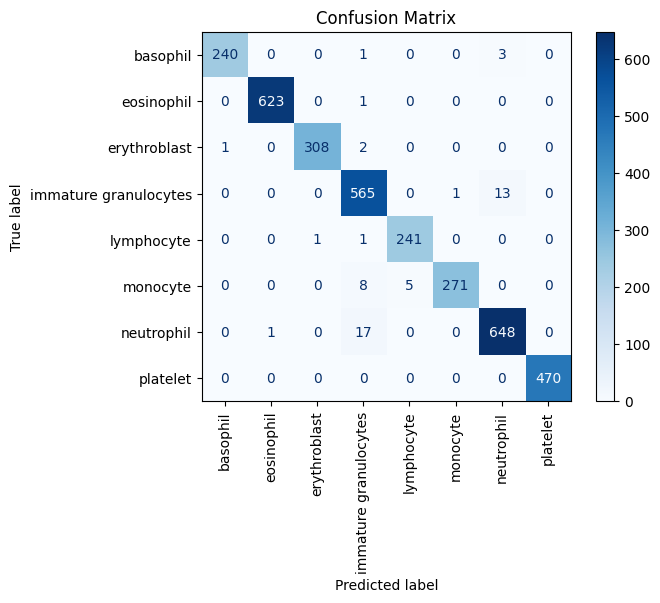


Displaying 10 random examples with true and predicted labels...


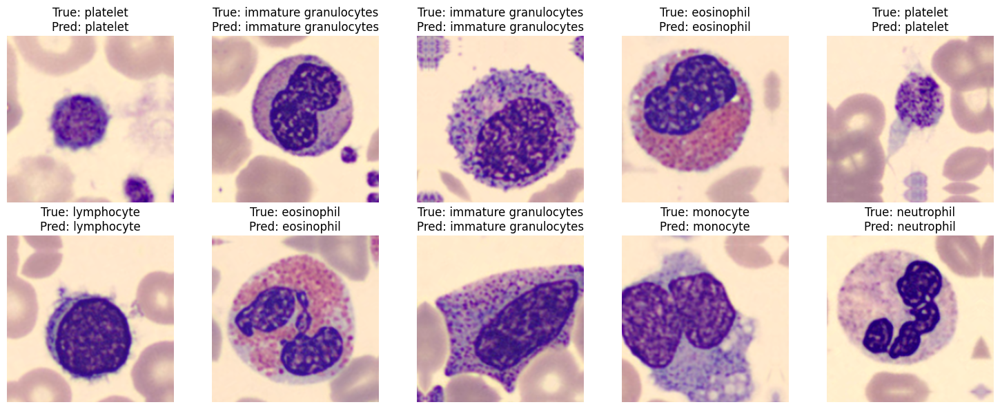

{'test_loss': 0.055394064635038376,
 'test_accuracy': 0.9850921034812927,
 'test_auc': 0.9992168545722961,
 'test_precision': 0.9856599569320679,
 'test_recall': 0.9845074415206909,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9959    0.9836    0.9897       244\n           eosinophil     0.9984    0.9984    0.9984       624\n         erythroblast     0.9968    0.9904    0.9935       311\nimmature granulocytes     0.9496    0.9758    0.9625       579\n           lymphocyte     0.9797    0.9918    0.9857       243\n             monocyte     0.9963    0.9542    0.9748       284\n           neutrophil     0.9759    0.9730    0.9744       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9839      3421\n            macro avg     0.9866    0.9834    0.9849      3421\n         weighted avg     0.9841    0.9839    0.9840      3421\n'}

In [ ]:
evaluate(save_path_resnet_18_224, test_dataset_224, num_classes=8, labels_mapping=labels_mapping)

### Performance on 224x224 Resolution  

Unlike previous CNN models, ResNet did not struggle with **224x224** resolution. When comparing its performance to **128x128** resolution, we observed improvements across problematic classes, along with significant gains over the 5-L CNN at the same resolution—achieving nearly **2× lower CPU time**.  

However, **128x128** resolution remains the optimal choice. While ResNet showed some improvements at this resolution, CPU time remains a critical factor. The same applies to the 5-L CNN on **128x128** resolution, as the performance difference is not substantial. In this case, opting for a **lighter model** is necessary to maintain efficiency.


As a next step we are goig to find ligther version of ResNet architecture that at least achieves the same level performance and reduces the computational cost.


In [ ]:
def resnet_(size=64, num_classes=8):
    def basic_block(X, kernel_size, num_filters, stride=1):
        X_shortcut = X

        # First convolution
        X = Conv2D(filters=num_filters, kernel_size=kernel_size, strides=stride, padding='same', kernel_initializer=HeNormal())(X)
        X = BatchNormalization()(X)
        X = Activation('relu')(X)

        # Second convolution
        X = Conv2D(filters=num_filters, kernel_size=kernel_size, strides=1, padding='same', kernel_initializer=HeNormal())(X)
        X = BatchNormalization()(X)

        # Adjust shortcut dimensions if stride != 1 or channel mismatch
        if stride != 1 or X_shortcut.shape[-1] != num_filters:
            X_shortcut = Conv2D(filters=num_filters, kernel_size=1, strides=stride, padding='same', kernel_initializer=HeNormal())(X_shortcut)
            X_shortcut = BatchNormalization()(X_shortcut)

        # Add shortcut to main path
        X = layers.add([X, X_shortcut])
        X = Activation('relu')(X)

        return X

    X_input = Input(shape=(size, size, 3))

    # Initial Convolution layer
    X = Conv2D(64, kernel_size=7, strides=2, padding='same', kernel_initializer=HeNormal())(X_input)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = MaxPooling2D(pool_size=3, strides=2, padding='same')(X)

    # Stage 1 (128 filters)
    X = basic_block(X, kernel_size=3, num_filters=128, stride=1)
    X = basic_block(X, kernel_size=3, num_filters=128, stride=1)

    # Stage 2 (256 filters)
    X = basic_block(X, kernel_size=3, num_filters=256, stride=2)
    X = basic_block(X, kernel_size=3, num_filters=256, stride=1)

    # Global Average Pooling and Output
    X = GlobalAveragePooling2D()(X)
    X = Dense(num_classes, activation='softmax', kernel_initializer=HeNormal())(X)

    # Create model
    model = Model(inputs=X_input, outputs=X)

    return model

In [ ]:
resnet_light_64 = resnet_(size=64, num_classes=8)
resnet_light_64.summary()

K.clear_session()

resnet_light_224 = resnet_(size=224, num_classes=8)
resnet_light_224.summary()

K.clear_session()

resnet_light_128 = resnet_(size=128, num_classes=8)
resnet_light_128.summary()



Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_20 (Conv2D)        │ (None, 32, 32, 64)     │          9,472 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 32, 32, 64)     │            256 │ conv2d_20[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_17             │ (None, 32, 32, 64)     │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 16, 16, 64)     │              0 │ activation_17[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_21 (Conv2D)        │ (None, 16, 16, 128)    │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 16, 16, 128)    │            512 │ conv2d_21[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 16, 16, 128)    │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 16, 16, 128)    │        147,584 │ activation_18[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 16, 16, 128)    │          8,320 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_22    │ (None, 16, 16, 128)    │            512 │ conv2d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_23    │ (None, 16, 16, 128)    │            512 │ conv2d_23[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_8 (Add)               │ (None, 16, 16, 128)    │              0 │ batch_normalization_2… │
│                           │                        │                │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_19             │ (None, 16, 16, 128)    │              0 │ add_8[0][0]            │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)   

 Total params: 2,642,824 (10.08 MB)

 Trainable params: 2,638,856 (10.07 MB)

 Non-trainable params: 3,968 (15.50 KB)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 112, 112, 64)   │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 112, 112, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 112, 112, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 56, 56, 64)     │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 56, 56, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 56, 56, 128)    │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 56, 56, 128)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 56, 56, 128)    │        147,584 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 56, 56, 128)    │          8,320 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 56, 56, 128)    │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 56, 56, 128)    │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 56, 56, 128)    │              0 │ batch_normalization_2… │
│                           │                        │                │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 56, 56, 128)    │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 56, 56, 128)    │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 56, 56, 128)    │            512 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 2,642,824 (10.08 MB)

 Trainable params: 2,638,856 (10.07 MB)

 Non-trainable params: 3,968 (15.50 KB)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 64, 64, 64)     │          9,472 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 64, 64, 64)     │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 64, 64, 64)     │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 32, 32, 64)     │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 32, 32, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 32, 32, 128)    │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 32, 32, 128)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 128)    │        147,584 │ activation_1[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 32, 32, 128)    │          8,320 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 32, 32, 128)    │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 32, 32, 128)    │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 32, 32, 128)    │              0 │ batch_normalization_2… │
│                           │                        │                │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 32, 32, 128)    │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 32, 32, 128)    │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 32, 32, 128)    │            512 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 2,642,824 (10.08 MB)

 Trainable params: 2,638,856 (10.07 MB)

 Non-trainable params: 3,968 (15.50 KB)

We start with **128x128** resolution to train and test our lighter ResNet model.

In [ ]:
save_path_resnet_light_128 = "/content/drive/MyDrive/Mnist/results/ResNet_light_128_"
csv_log_path_resnet_light_128 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_light_128_"
resnet_light_128, history_resnet_light_128 = train_model(resnet_light_128, train_dataset, val_dataset, batch_size=64, epochs=70, save_path = save_path_resnet_light_128, csv_log_path=csv_log_path_resnet_light_128,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 359.14 seconds


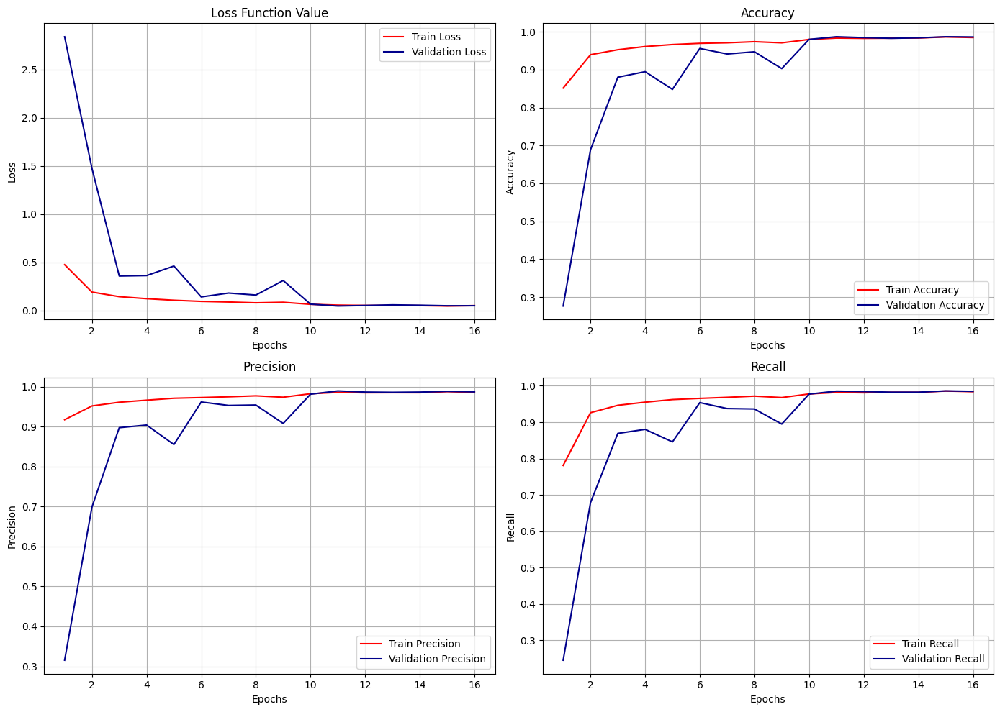

In [ ]:
plot_metrics(save_path_resnet_light_128)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0563
Test Accuracy: 0.9845
Test AUC: 0.9995
Test Precision: 0.9859
Test Recall: 0.9836

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9917    0.9836    0.9877       244
           eosinophil     0.9984    0.9968    0.9976       624
         erythroblast     0.9935    0.9904    0.9919       311
immature granulocytes     0.9621    0.9637    0.9629       579
           lymphocyte     0.9877    0.9877    0.9877       243
             monocyte     0.9858    0.9754    0.9805       284
           neutrophil     0.9702    0.9790    0.9746       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9842      3421
            macro avg     0.9862    0.9846    0.9854      3421
         weighted avg     0.9843    0.9842    0.9842      3421


Confusion Matrix:


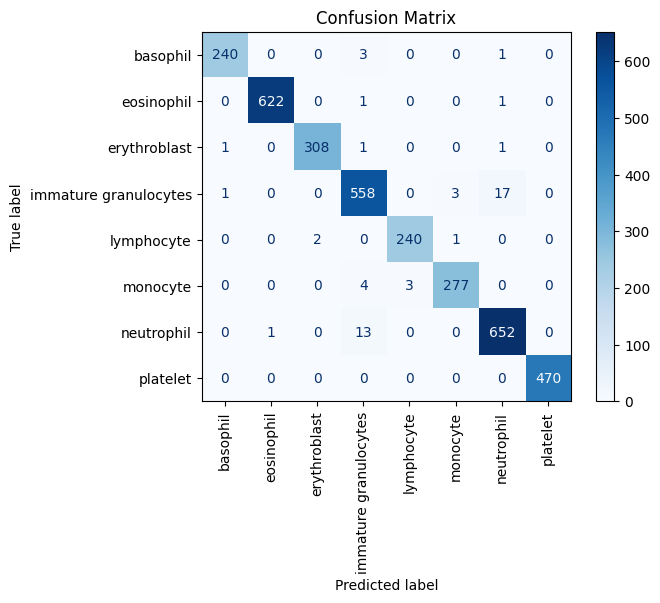


Displaying 10 random examples with true and predicted labels...


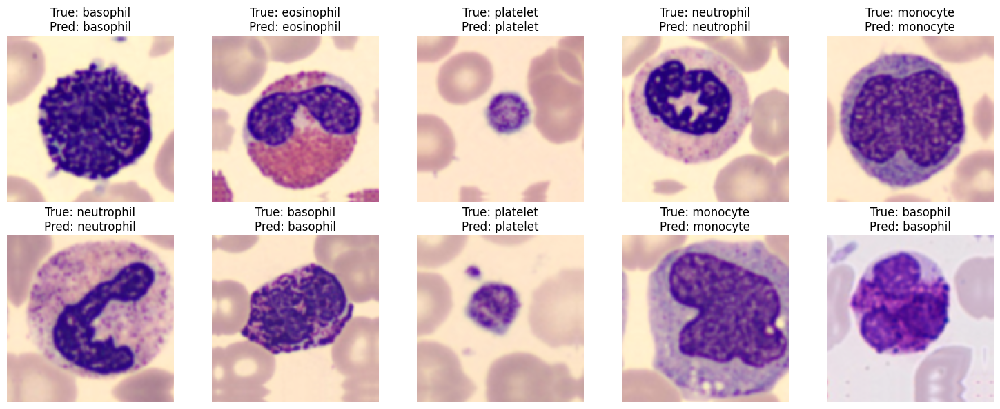

{'test_loss': 0.05627395957708359,
 'test_accuracy': 0.9845074415206909,
 'test_auc': 0.9994818568229675,
 'test_precision': 0.9859361052513123,
 'test_recall': 0.9836305379867554,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9917    0.9836    0.9877       244\n           eosinophil     0.9984    0.9968    0.9976       624\n         erythroblast     0.9935    0.9904    0.9919       311\nimmature granulocytes     0.9621    0.9637    0.9629       579\n           lymphocyte     0.9877    0.9877    0.9877       243\n             monocyte     0.9858    0.9754    0.9805       284\n           neutrophil     0.9702    0.9790    0.9746       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9842      3421\n            macro avg     0.9862    0.9846    0.9854      3421\n         weighted avg     0.9843    0.9842    0.9842      3421\n'}

In [ ]:
evaluate(save_path_resnet_light_128, test_dataset, num_classes=8, labels_mapping=labels_mapping)

**64x64 resolution**

In [ ]:
save_path_resnet_light_64 = "/content/drive/MyDrive/Mnist/results/ResNet_light_64_"
csv_log_path_resnet_light_64 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_light_64_"
resnet_light_64, history_resnet_light_64 = train_model(resnet_light_64, train_dataset_64, val_dataset_64, batch_size=128, epochs=70, save_path = save_path_resnet_light_64, csv_log_path=csv_log_path_resnet_light_64,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 299.10 seconds


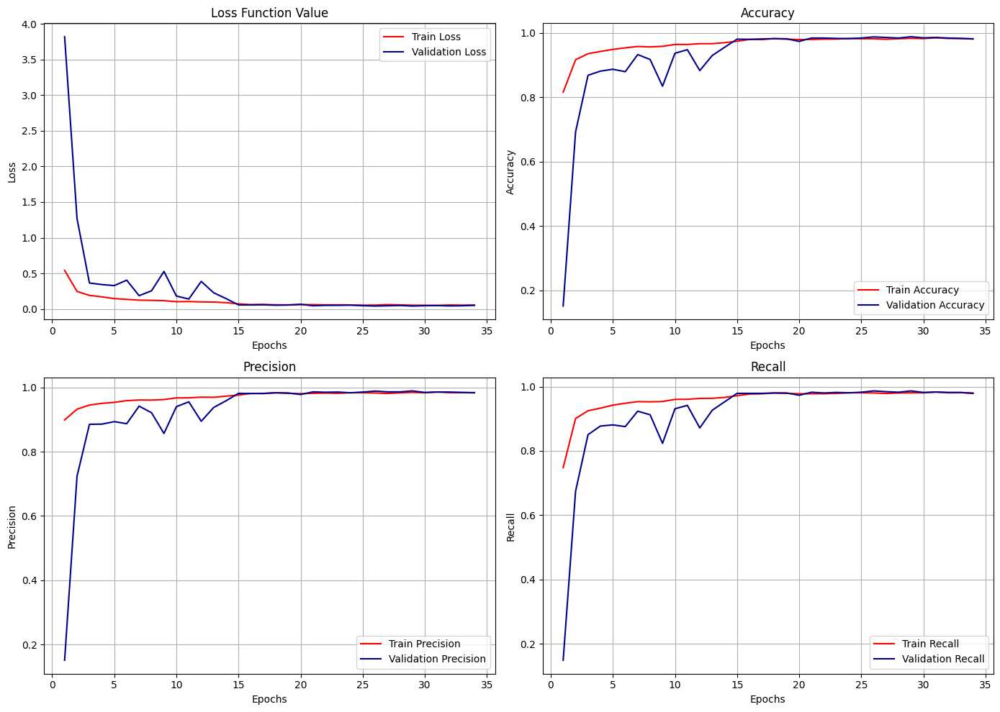

In [ ]:
plot_metrics(save_path_resnet_light_64)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0605
Test Accuracy: 0.9813
Test AUC: 0.9994
Test Precision: 0.9827
Test Recall: 0.9795

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9720    0.9959    0.9838       244
           eosinophil     0.9984    0.9984    0.9984       624
         erythroblast     0.9838    0.9775    0.9806       311
immature granulocytes     0.9618    0.9568    0.9593       579
           lymphocyte     0.9876    0.9794    0.9835       243
             monocyte     0.9788    0.9754    0.9771       284
           neutrophil     0.9746    0.9775    0.9760       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9822      3421
            macro avg     0.9821    0.9826    0.9823      3421
         weighted avg     0.9822    0.9822    0.9822      3421


Confusion Matrix:


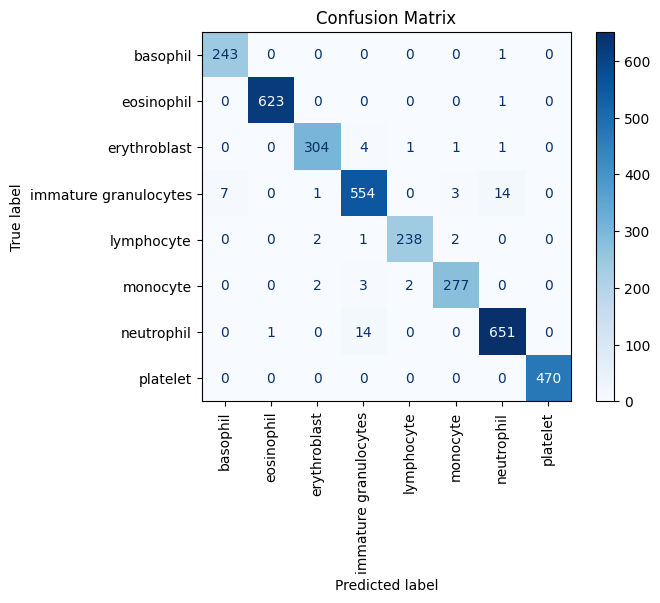


Displaying 10 random examples with true and predicted labels...


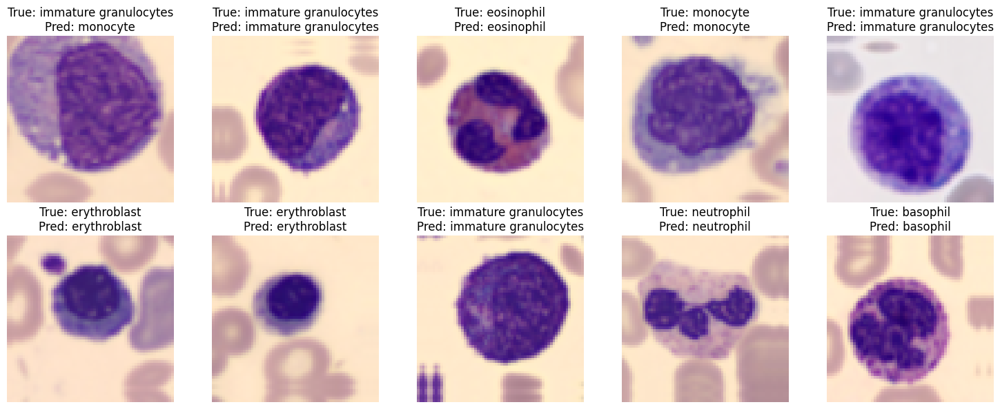

{'test_loss': 0.06053841486573219,
 'test_accuracy': 0.9812920093536377,
 'test_auc': 0.9994438290596008,
 'test_precision': 0.9826979637145996,
 'test_recall': 0.9795381426811218,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9720    0.9959    0.9838       244\n           eosinophil     0.9984    0.9984    0.9984       624\n         erythroblast     0.9838    0.9775    0.9806       311\nimmature granulocytes     0.9618    0.9568    0.9593       579\n           lymphocyte     0.9876    0.9794    0.9835       243\n             monocyte     0.9788    0.9754    0.9771       284\n           neutrophil     0.9746    0.9775    0.9760       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9822      3421\n            macro avg     0.9821    0.9826    0.9823      3421\n         weighted avg     0.9822    0.9822    0.9822      3421\n'}

In [ ]:
evaluate(save_path_resnet_light_64, test_dataset_64, num_classes=8, labels_mapping=labels_mapping)

# Residual Attention Network


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, GlobalAveragePooling2D, Dense, Input, Add, MaxPooling2D, Multiply, Reshape
from tensorflow.keras.initializers import HeNormal, GlorotUniform

# Squeeze-and-Excitation (SE) Block
def se_block(input_tensor, reduction=16):
    channels = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Dense(channels // reduction, activation='relu', kernel_initializer=HeNormal())(se)
    se = Dense(channels, activation='sigmoid', kernel_initializer=HeNormal())(se)
    se = Reshape([1, 1, channels])(se)
    return Multiply()([input_tensor, se])

# Basic Block with SE Attention
def basic_block(X, kernel_size=3, num_filters=64, stride=1):
    X_shortcut = X

    # First convolution
    X = Conv2D(filters=num_filters, kernel_size=kernel_size, strides=stride, padding='same', kernel_initializer=HeNormal())(X)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)

    # Second convolution
    X = Conv2D(filters=num_filters, kernel_size=kernel_size, strides=1, padding='same', kernel_initializer=HeNormal())(X)
    X = BatchNormalization(axis=3)(X)

    # Adjust shortcut if needed
    if stride != 1 or X_shortcut.shape[-1] != num_filters:
        X_shortcut = Conv2D(filters=num_filters, kernel_size=1, strides=stride, padding='same', kernel_initializer=HeNormal())(X_shortcut)
        X_shortcut = BatchNormalization(axis=3)(X_shortcut)

    # Add shortcut to main path
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)

    # Add SE attention
    X = se_block(X)

    return X

# ResNet-18 with SE Attention
def resnet18_a(size=64, num_classes=8):
    X_input = Input(shape=(size, size, 3))

    # Stage 1: Initial Conv Layer
    X = Conv2D(64, kernel_size=5, strides=2, padding="same", kernel_initializer=HeNormal())(X_input)
    X = BatchNormalization()(X)
    X = Activation("relu")(X)
    X = MaxPooling2D(pool_size=3, strides=2, padding="same")(X)

    # Stage 2
    X = basic_block(X, kernel_size=3, num_filters=128, stride=2)
    X = basic_block(X, kernel_size=3, num_filters=128, stride=1)

    # Stage 3
    X = basic_block(X, kernel_size=3, num_filters=256, stride=2)
    X = basic_block(X, kernel_size=3, num_filters=256, stride=1)


    # Global Average Pooling and Output
    X = GlobalAveragePooling2D()(X)
    X = Dense(num_classes, activation="softmax", kernel_initializer=HeNormal())(X)

    # Create model
    model = Model(inputs=X_input, outputs=X)

    return model


In [ ]:
resnet_18_a_64 = resnet18_a(size = 64, num_classes=8)
resnet_18_a_64.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 64, 64, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 32, 32, 64)     │          4,864 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_11    │ (None, 32, 32, 64)     │            256 │ conv2d_11[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_9 (Activation) │ (None, 32, 32, 64)     │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 16, 16, 64)     │              0 │ activation_9[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_12 (Conv2D)        │ (None, 8, 8, 128)      │         73,856 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_12    │ (None, 8, 8, 128)      │            512 │ conv2d_12[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_10             │ (None, 8, 8, 128)      │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_13 (Conv2D)        │ (None, 8, 8, 128)      │        147,584 │ activation_10[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_14 (Conv2D)        │ (None, 8, 8, 128)      │          8,320 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_13    │ (None, 8, 8, 128)      │            512 │ conv2d_13[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_14    │ (None, 8, 8, 128)      │            512 │ conv2d_14[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_4 (Add)               │ (None, 8, 8, 128)      │              0 │ batch_normalization_1… │
│                           │                        │                │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_11             │ (None, 8, 8, 128)      │              0 │ add_4[0][0]            │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d… │ (None, 128)            │              0 │ activation_11[0][0]    │
│ (GlobalAveragePooling

 Total params: 2,659,512 (10.15 MB)

 Trainable params: 2,655,544 (10.13 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
save_path_resnet_attention_18_64 = "/content/drive/MyDrive/Mnist/results/ResNet_18a_64_1"
csv_log_path_resnet_attention_18_64 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_18a_64_1"
resnet_18_attention_64, history_resnet_attention_64 = train_model(resnet_18_a_64, train_dataset_64, val_dataset_64, batch_size=64, epochs=70, save_path = save_path_resnet_attention_18_64, csv_log_path = csv_log_path_resnet_attention_18_64 ,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 217.19 seconds


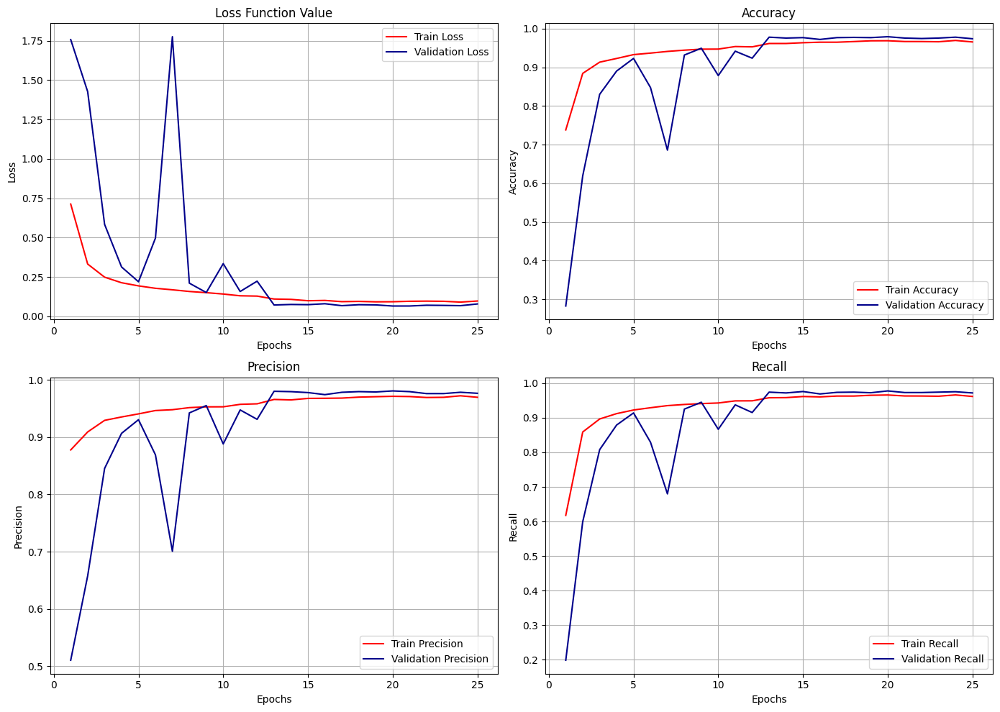

In [ ]:
plot_metrics(save_path_resnet_attention_18_64)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0959
Test Accuracy: 0.9702
Test AUC: 0.9986
Test Precision: 0.9733
Test Recall: 0.9678

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9595    0.9713    0.9654       244
           eosinophil     0.9968    0.9968    0.9968       624
         erythroblast     0.9806    0.9743    0.9774       311
immature granulocytes     0.9245    0.9309    0.9277       579
           lymphocyte     0.9715    0.9835    0.9775       243
             monocyte     0.9526    0.9190    0.9355       284
           neutrophil     0.9701    0.9730    0.9715       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9702      3421
            macro avg     0.9694    0.9686    0.9690      3421
         weighted avg     0.9702    0.9702    0.9702      3421


Confusion Matrix:


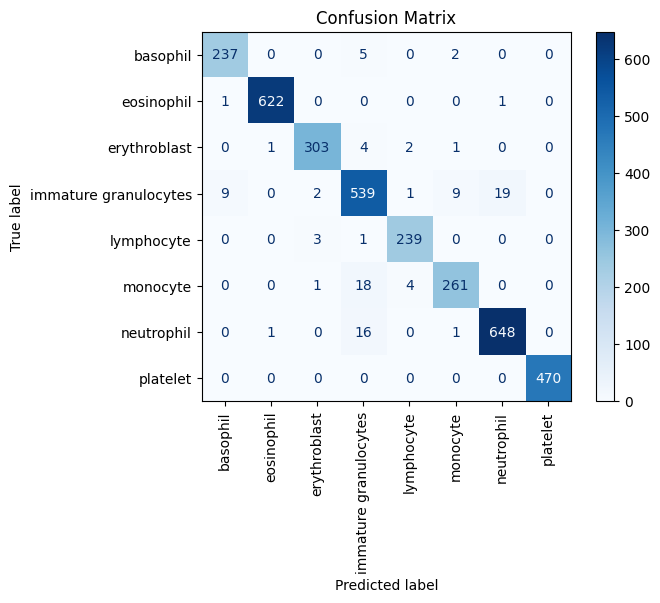


Displaying 10 random examples with true and predicted labels...


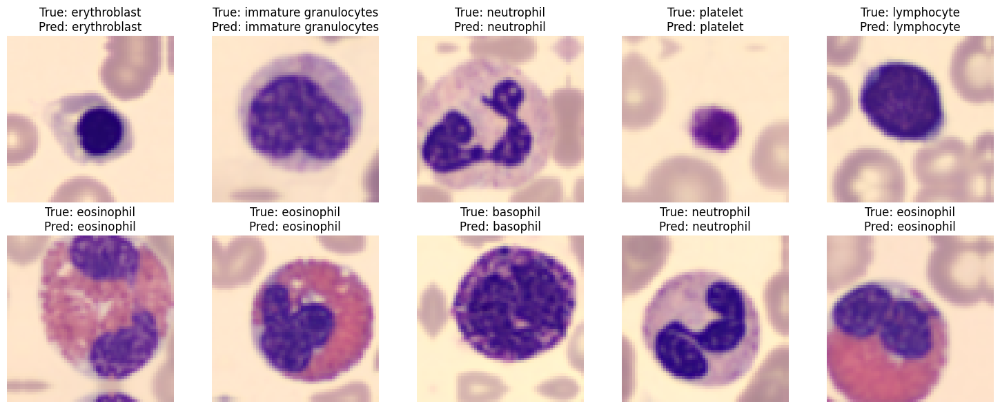

{'test_loss': 0.09594839066267014,
 'test_accuracy': 0.9701841473579407,
 'test_auc': 0.9985849857330322,
 'test_precision': 0.9732510447502136,
 'test_recall': 0.9678456783294678,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9595    0.9713    0.9654       244\n           eosinophil     0.9968    0.9968    0.9968       624\n         erythroblast     0.9806    0.9743    0.9774       311\nimmature granulocytes     0.9245    0.9309    0.9277       579\n           lymphocyte     0.9715    0.9835    0.9775       243\n             monocyte     0.9526    0.9190    0.9355       284\n           neutrophil     0.9701    0.9730    0.9715       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9702      3421\n            macro avg     0.9694    0.9686    0.9690      3421\n         weighted avg     0.9702    0.9702    0.9702      3421\n'}

In [ ]:
evaluate(save_path_resnet_attention_18_64, test_dataset_64, num_classes=8, labels_mapping=labels_mapping)

**128x128 dataset**

In [ ]:
resnet_18_a_128 = resnet18_a(size = 128, num_classes=8)
resnet_18_a_128.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 64, 64, 64)     │          4,864 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_22    │ (None, 64, 64, 64)     │            256 │ conv2d_22[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_18             │ (None, 64, 64, 64)     │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 64)     │              0 │ activation_18[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 16, 16, 128)    │         73,856 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_23    │ (None, 16, 16, 128)    │            512 │ conv2d_23[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_19             │ (None, 16, 16, 128)    │              0 │ batch_normalization_2… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 16, 16, 128)    │        147,584 │ activation_19[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 16, 16, 128)    │          8,320 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_24    │ (None, 16, 16, 128)    │            512 │ conv2d_24[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_25    │ (None, 16, 16, 128)    │            512 │ conv2d_25[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_8 (Add)               │ (None, 16, 16, 128)    │              0 │ batch_normalization_2… │
│                           │                        │                │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_20             │ (None, 16, 16, 128)    │              0 │ add_8[0][0]            │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_poolin

 Total params: 2,659,512 (10.15 MB)

 Trainable params: 2,655,544 (10.13 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
save_path_resnet_attention_18_128 = "/content/drive/MyDrive/Mnist/results/ResNet_18a_128_2"
csv_log_path_resnet_attention_18_128 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_18a_128_2"
resnet_18_attention_128, history_resnet_attention_128 = train_model(resnet_18_a_128, train_dataset, val_dataset, batch_size=64, epochs=70, save_path = save_path_resnet_attention_18_128, csv_log_path = csv_log_path_resnet_attention_18_128 ,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 292.60 seconds


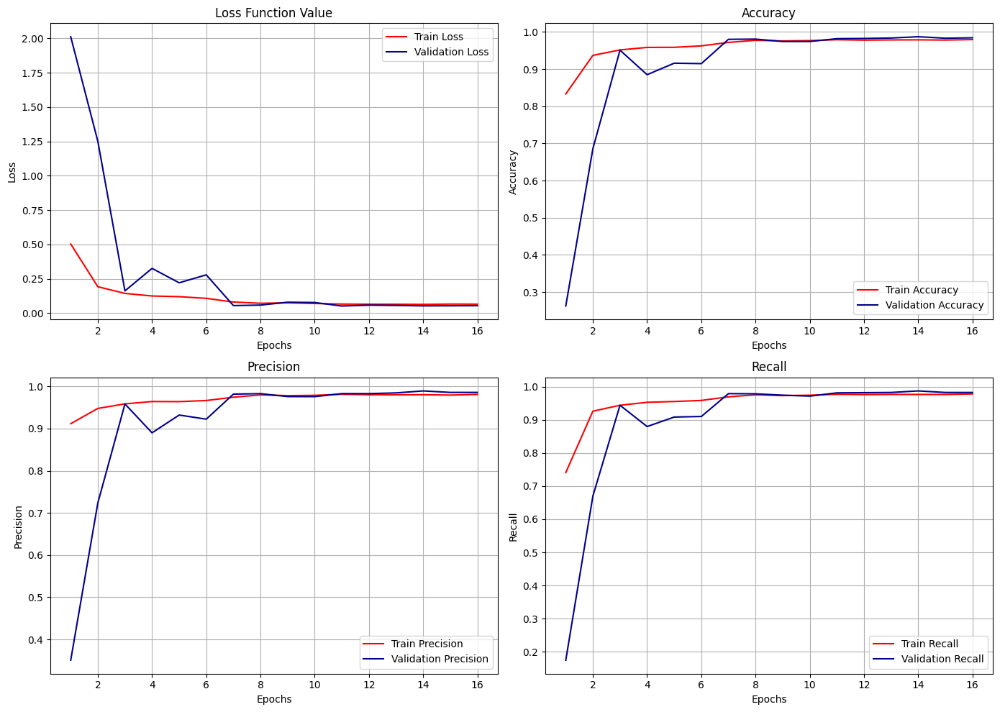

In [ ]:
plot_metrics(save_path_resnet_attention_18_128)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0612
Test Accuracy: 0.9839
Test AUC: 0.9993
Test Precision: 0.9847
Test Recall: 0.9804

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9798    0.9918    0.9857       244
           eosinophil     0.9984    0.9968    0.9976       624
         erythroblast     0.9935    0.9807    0.9871       311
immature granulocytes     0.9616    0.9516    0.9566       579
           lymphocyte     0.9796    0.9877    0.9836       243
             monocyte     0.9754    0.9754    0.9754       284
           neutrophil     0.9717    0.9790    0.9753       666
             platelet     0.9979    1.0000    0.9989       470

             accuracy                         0.9819      3421
            macro avg     0.9822    0.9829    0.9825      3421
         weighted avg     0.9819    0.9819    0.9819      3421


Confusion Matrix:


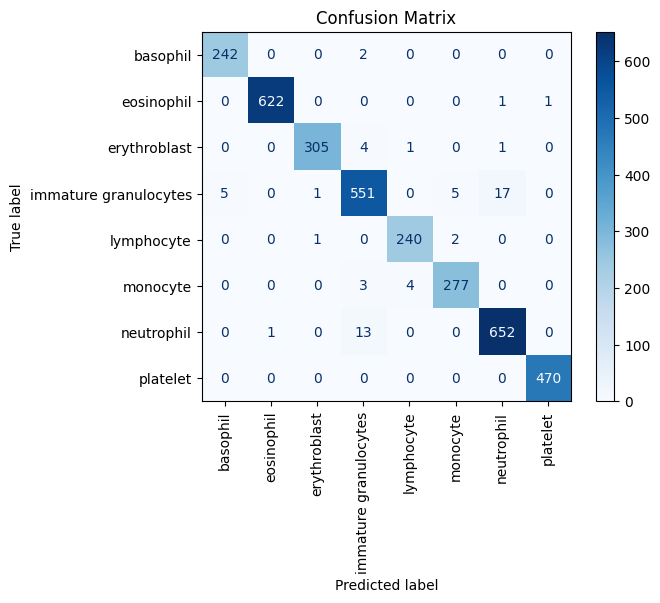


Displaying 10 random examples with true and predicted labels...


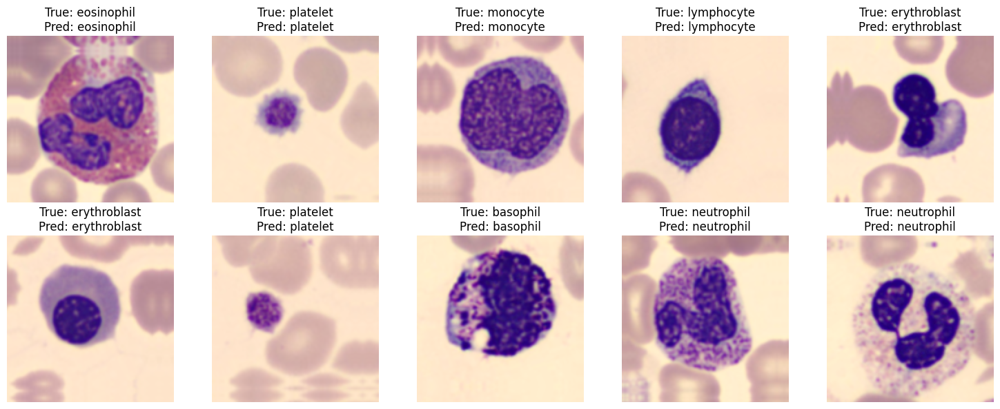

{'test_loss': 0.06116746738553047,
 'test_accuracy': 0.9839228391647339,
 'test_auc': 0.9992802143096924,
 'test_precision': 0.9847328066825867,
 'test_recall': 0.9804151058197021,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9798    0.9918    0.9857       244\n           eosinophil     0.9984    0.9968    0.9976       624\n         erythroblast     0.9935    0.9807    0.9871       311\nimmature granulocytes     0.9616    0.9516    0.9566       579\n           lymphocyte     0.9796    0.9877    0.9836       243\n             monocyte     0.9754    0.9754    0.9754       284\n           neutrophil     0.9717    0.9790    0.9753       666\n             platelet     0.9979    1.0000    0.9989       470\n\n             accuracy                         0.9819      3421\n            macro avg     0.9822    0.9829    0.9825      3421\n         weighted avg     0.9819    0.9819    0.9819      3421\n'}

In [ ]:
evaluate(save_path_resnet_attention_18_128, test_dataset, num_classes=8, labels_mapping=labels_mapping)

**224x224 dataset**

In [ ]:
resnet_18_a_224 = resnet18_a(size = 224, num_classes=8)
resnet_18_a_224.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_33 (Conv2D)        │ (None, 112, 112, 64)   │          4,864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_33    │ (None, 112, 112, 64)   │            256 │ conv2d_33[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_27             │ (None, 112, 112, 64)   │              0 │ batch_normalization_3… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 56, 56, 64)     │              0 │ activation_27[0][0]    │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 28, 28, 128)    │         73,856 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_34    │ (None, 28, 28, 128)    │            512 │ conv2d_34[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_28             │ (None, 28, 28, 128)    │              0 │ batch_normalization_3… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_35 (Conv2D)        │ (None, 28, 28, 128)    │        147,584 │ activation_28[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_36 (Conv2D)        │ (None, 28, 28, 128)    │          8,320 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_35    │ (None, 28, 28, 128)    │            512 │ conv2d_35[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_36    │ (None, 28, 28, 128)    │            512 │ conv2d_36[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_12 (Add)              │ (None, 28, 28, 128)    │              0 │ batch_normalization_3… │
│                           │                        │                │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_29             │ (None, 28, 28, 128)    │              0 │ add_12[0][0]           │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_poolin

 Total params: 2,659,512 (10.15 MB)

 Trainable params: 2,655,544 (10.13 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:
save_path_resnet_attention_18_224 = "/content/drive/MyDrive/Mnist/results/ResNet_18a_224_1"
csv_log_path_resnet_attention_18_224 = "/content/drive/MyDrive/Mnist/results/ResNet_metrics_18a_224_1"
resnet_18_attention_224, history_resnet_attention_224 = train_model(resnet_18_a_224, train_dataset_224, val_dataset_224, batch_size=64, epochs=70, save_path = save_path_resnet_attention_18_224, csv_log_path = csv_log_path_resnet_attention_18_224 ,learning_rate=0.0001, average_type="micro")


Model already exists. Loading the saved model.
Total training time from saved model: 725.71 seconds


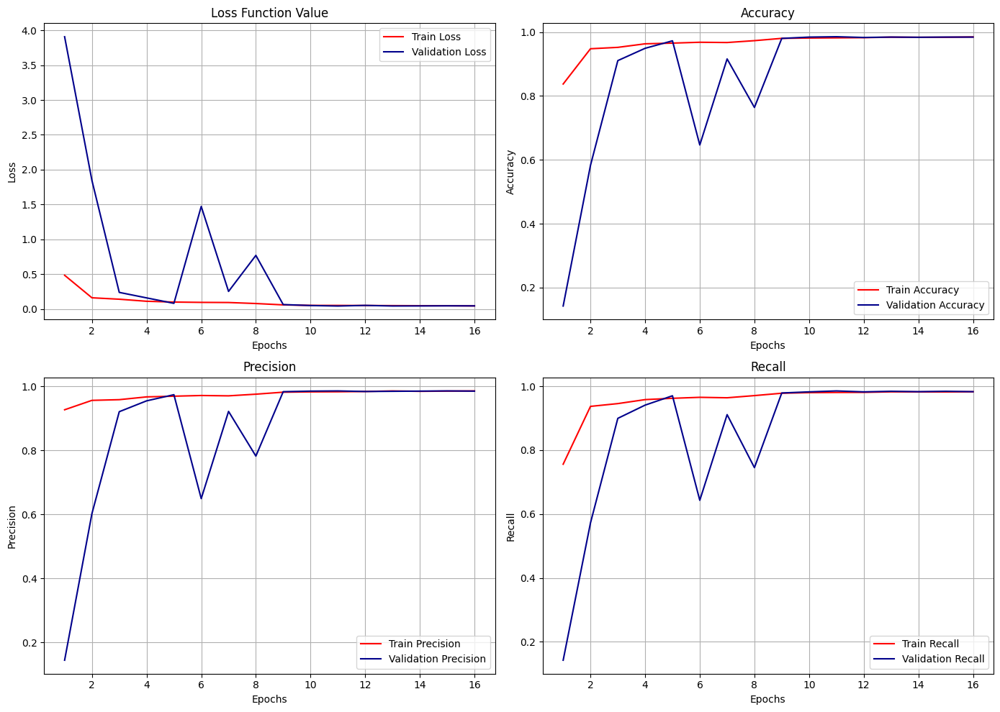

In [ ]:
plot_metrics(save_path_resnet_attention_18_224)

Loading the trained model...

Evaluating on test dataset...

Test Loss: 0.0564
Test Accuracy: 0.9813
Test AUC: 0.9991
Test Precision: 0.9830
Test Recall: 0.9804

Classification Report:
                       precision    recall  f1-score   support

             basophil     0.9877    0.9877    0.9877       244
           eosinophil     0.9968    0.9984    0.9976       624
         erythroblast     0.9903    0.9871    0.9887       311
immature granulocytes     0.9503    0.9585    0.9544       579
           lymphocyte     0.9917    0.9835    0.9876       243
             monocyte     0.9855    0.9542    0.9696       284
           neutrophil     0.9673    0.9760    0.9716       666
             platelet     1.0000    1.0000    1.0000       470

             accuracy                         0.9810      3421
            macro avg     0.9837    0.9807    0.9822      3421
         weighted avg     0.9811    0.9810    0.9810      3421


Confusion Matrix:


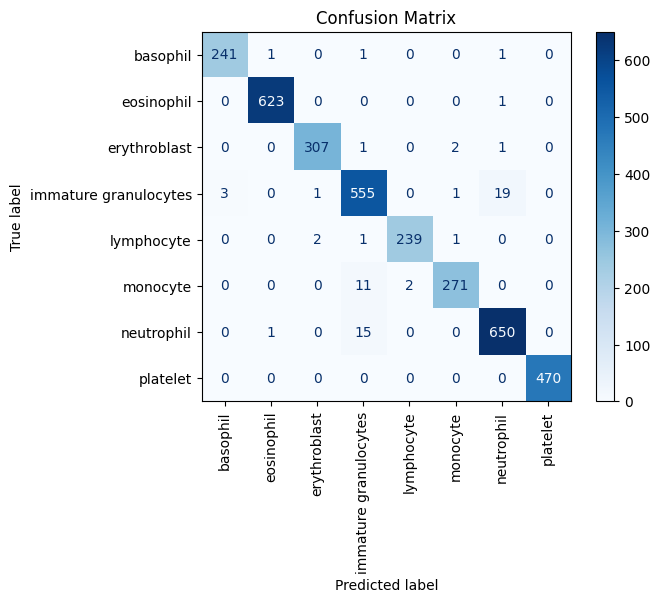


Displaying 10 random examples with true and predicted labels...


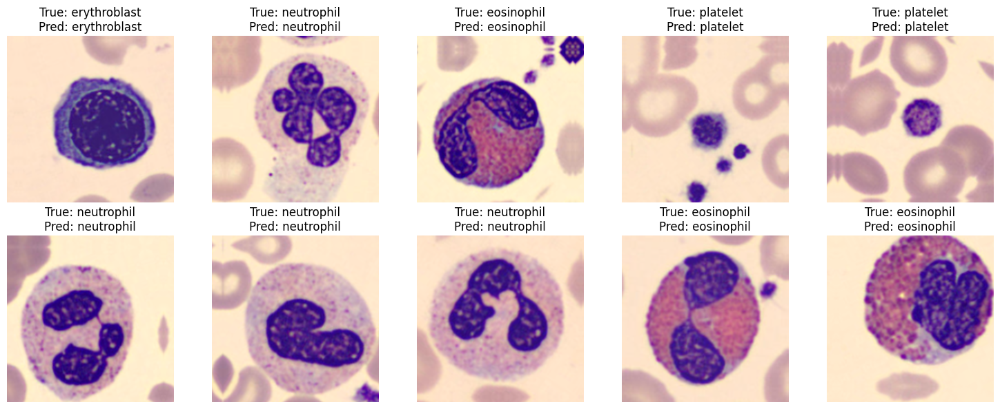

{'test_loss': 0.056358784437179565,
 'test_accuracy': 0.9812920093536377,
 'test_auc': 0.9991418123245239,
 'test_precision': 0.983001172542572,
 'test_recall': 0.9804151058197021,
 'classification_report': '                       precision    recall  f1-score   support\n\n             basophil     0.9877    0.9877    0.9877       244\n           eosinophil     0.9968    0.9984    0.9976       624\n         erythroblast     0.9903    0.9871    0.9887       311\nimmature granulocytes     0.9503    0.9585    0.9544       579\n           lymphocyte     0.9917    0.9835    0.9876       243\n             monocyte     0.9855    0.9542    0.9696       284\n           neutrophil     0.9673    0.9760    0.9716       666\n             platelet     1.0000    1.0000    1.0000       470\n\n             accuracy                         0.9810      3421\n            macro avg     0.9837    0.9807    0.9822      3421\n         weighted avg     0.9811    0.9810    0.9810      3421\n'}

In [ ]:
evaluate(save_path_resnet_attention_18_224, test_dataset_224, num_classes=8, labels_mapping=labels_mapping)


# Grad Cam

Model loaded from Keras format at: /content/drive/MyDrive/Mnist/results/ResNet_18a_128_.keras
Model loaded from Keras format at: /content/drive/MyDrive/Mnist/results/cnn_5_layer_128.keras
Model loaded from Keras format at: /content/drive/MyDrive/Mnist/results/ResNet_18b_128.keras


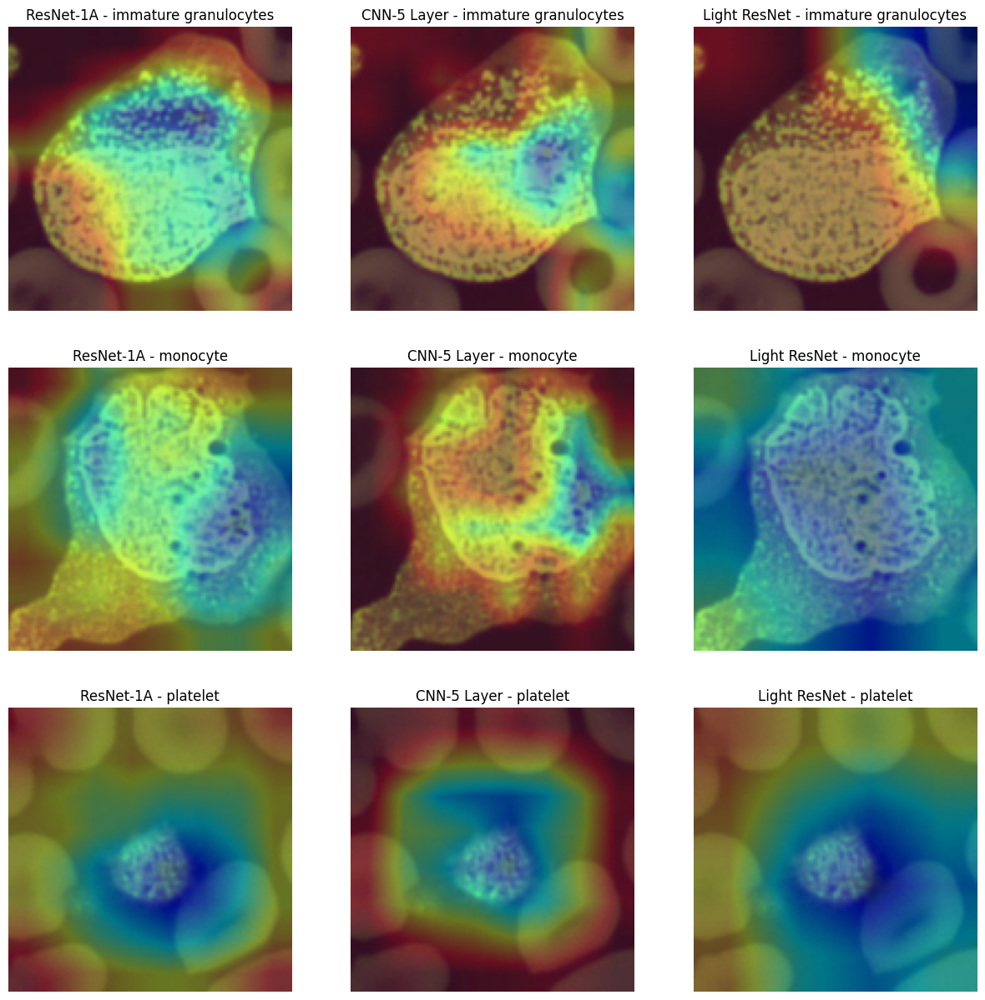

In [ ]:
import cv2

# Function to automatically find the last convolutional layer
def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name  # Return the name of the last Conv2D layer
    raise ValueError("No convolutional layer found in the model.")

# Grad-CAM function (now works dynamically with any model)
def grad_cam(model, img_array):
    layer_name = get_last_conv_layer(model)  # Auto-detect last Conv2D layer
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    # Compute gradients
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_idx = tf.argmax(predictions[0])  # Get predicted class index
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)  # Compute gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # Global average pooling

    # Weight feature maps by importance
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    # Normalize heatmap
    heatmap = np.maximum(heatmap, 0)  # Apply ReLU
    heatmap /= np.max(heatmap)  # Normalize to range 0-1

    return heatmap  # Return as NumPy array

# Function to overlay Grad-CAM heatmap on an image
def overlay_heatmap(img, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))  # Resize heatmap
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 scale
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply color map
    superimposed_img = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)
    return superimposed_img

# Function to get one random image for each chosen label
def get_random_images_for_labels(X_test, y_test, chosen_labels):
    images_labels = []
    for label in chosen_labels:
        label_indices = np.where(y_test == label)[0]  # Get indices of images with this label
        if len(label_indices) == 0:
            raise ValueError(f"No images found for label {label}.")
        random_index = np.random.choice(label_indices)  # Randomly choose one
        images_labels.append((X_test[random_index], y_test[random_index]))  # Store image and label
    return images_labels  # Return list of (image, label) pairs

# Function to preprocess the image for the model
def preprocess_image(image):
    return np.expand_dims(image / 255.0, axis=0)  # Normalize and add batch dimension

# Function to load the model from the given path
def load_model_from_path(path):
    if not os.path.exists(path):
        raise ValueError(f"Path does not exist: {path}")

    if os.path.isfile(path):
        if path.endswith('.h5') or path.endswith('.keras'):
            model = tf.keras.models.load_model(path)
            print(f"Model loaded from Keras format at: {path}")
        else:
            raise ValueError(f"Unsupported file format for {path}")
    elif os.path.isdir(path):
        if os.path.exists(os.path.join(path, 'saved_model.pb')):
            model = tf.saved_model.load(path)
            print(f"Model loaded from SavedModel format at: {path}")
        else:
            raise ValueError(f"SavedModel not found in directory: {path}")
    else:
        raise ValueError(f"Invalid path format: {path}")

    return model


# Define model paths and corresponding model names
model_info = {
    '/content/drive/MyDrive/Mnist/results/ResNet_18a_128_.keras': 'ResNet-1A',
    '/content/drive/MyDrive/Mnist/results/cnn_5_layer_128.keras': 'CNN-5 Layer',
    '/content/drive/MyDrive/Mnist/results/ResNet_18b_128.keras': 'Light ResNet'
}

# Load models and store names
models = []
model_names = []

for path, name in model_info.items():
    try:
        model = load_model_from_path(path)
        models.append(model)
        model_names.append(name)  # Store corresponding model name
    except ValueError as e:
        print(f"Error loading model from path {path}: {e}")

if len(models) == 0:
    print("No models loaded. Please check the model paths.")


# Function to plot Grad-CAM with model names
def plot_grad_cam_for_models(models, model_names, X_test, y_test, chosen_labels):
    images_labels = get_random_images_for_labels(X_test, y_test, chosen_labels)  # Get images

    plt.figure(figsize=(len(models) * 5, len(chosen_labels) * 5))

    for row, (image, label) in enumerate(images_labels):  # Loop through chosen labels
        img_array = preprocess_image(image)  # Preprocess the image

        for col, (model, model_name) in enumerate(zip(models, model_names)):  # Loop through models & names
            heatmap = grad_cam(model, img_array)  # Compute Grad-CAM
            result_img = overlay_heatmap((image * 255).astype(np.uint8), heatmap)  # Overlay heatmap

            plt.subplot(len(chosen_labels), len(models), row * len(models) + col + 1)
            plt.imshow(result_img)
            plt.title(f"{model_name} - {labels_mapping[int(label.item())]}")  # Display model name
            plt.axis('off')

    plt.show()

chosen_labels = [3, 5, 7]
if len(models) > 0:
    plot_grad_cam_for_models(models, model_names, X_test, y_test, chosen_labels)


